# 目标

# 方法

# 目录

# 数据集描述

    为了应对COVID-19的大流行病，白宫和一个主要研究小组联盟已经准备好COVID-19开放研究数据集（CORD-19）。CORD-19是一个超过51000篇学术文章的资源，包括40000多篇全文，关于COVID-19，SARS-CoV-2和相关冠状病毒。这一免费提供的数据集提供给全球研究界，以应用自然语言处理和其他人工智能技术的最新进展，产生新的见解，支持正在进行的防治这一传染病的斗争。由于新的冠状病毒文献的快速增长，使得医学研究界很难跟上这一趋势，因此对这些方法的研究变得越来越迫切。

# 一、加载数据

1.加载Metadata

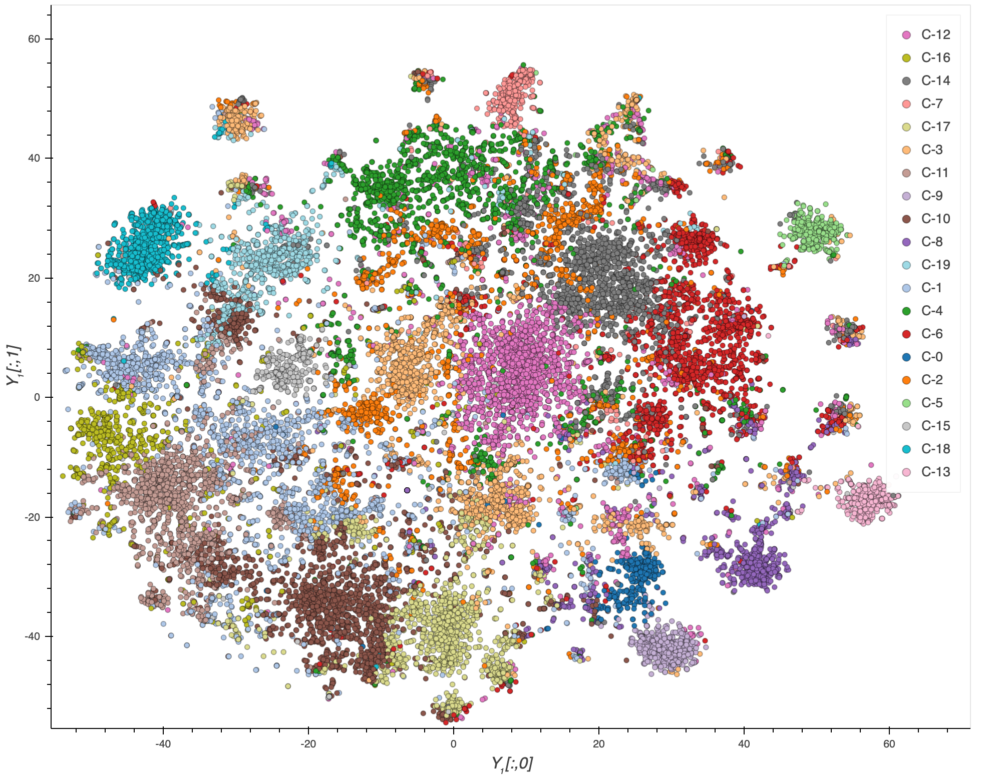

In [1]:
from IPython.display import Image
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/cover/bokeh_plot.png', width=800, height=800)

In [45]:
pip --default-timeout=100 install langdetect
pip --default-timeout=100 install -U spacy

    100% |████████████████████████████████| 10.5MB 78kB/s ta 0:00:01
    100% |████████████████████████████████| 215kB 40kB/s ta 0:00:01
    100% |████████████████████████████████| 2.2MB 77kB/s ta 0:00:013
    100% |████████████████████████████████| 184kB 90kB/s ta 0:00:01
    100% |████████████████████████████████| 61kB 92kB/s ta 0:00:01
    100% |████████████████████████████████| 4.0MB 59kB/s ta 0:00:013
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import json
#pip --default-timeout=100 install langdetect

import matplotlib.pyplot as plt
plt.style.use('ggplot') # 使用自带的样式进行美化

加载数据集的元数据“title”和“journal”属性在稍后对文章进行聚类时可能很有用，以便查看哪些类型的文章进行了聚类。

In [3]:
root_path = '/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/CORD-19-research-challenge'
metadata_path = f'{root_path}/metadata.csv'
meta_df = pd.read_csv(metadata_path, dtype={
    'pubmed_id': str,
    'Microsoft Academic Paper ID': str, 
    'doi': str
})
meta_df.head()

/Users/yangshoujian/PycharmProjects/tfTest/venv/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (5,13,14,16) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
2,ejv2xln0,06ced00a5fc04215949aa72528f2eeaae1d58927,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,PMC59549,11667972,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/06ced00a5fc04215949aa...,document_parses/pmc_json/PMC59549.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3,2b73a28n,348055649b6b8cf2b9a376498df9bf41f7123605,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,PMC59574,11686871,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/348055649b6b8cf2b9a37...,document_parses/pmc_json/PMC59574.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4,9785vg6d,5f48792a5fa08bed9f56016f4981ae2ca6031b32,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,PMC59580,11686888,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/5f48792a5fa08bed9f560...,document_parses/pmc_json/PMC59580.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [61]:
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140532 entries, 0 to 140531
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   cord_uid          140532 non-null  object 
 1   sha               61927 non-null   object 
 2   source_x          140532 non-null  object 
 3   title             140493 non-null  object 
 4   doi               110163 non-null  object 
 5   pmcid             66611 non-null   object 
 6   pubmed_id         105399 non-null  object 
 7   license           140532 non-null  object 
 8   abstract          109618 non-null  object 
 9   publish_time      140518 non-null  object 
 10  authors           135360 non-null  object 
 11  journal           133127 non-null  object 
 12  mag_id            0 non-null       float64
 13  who_covidence_id  23775 non-null   object 
 14  arxiv_id          1601 non-null    object 
 15  pdf_json_files    61927 non-null   object 
 16  pmc_json_files    48

2.获取所有JSON文件

In [5]:
all_json = glob.glob(f'{root_path}/**/*.json', recursive=True)#遍历数据,可以用来进行类似正则表达式的操作,可以用通配符来搜索文件,便于文件的遍历。
len(all_json)#json文件个数

113933

In [60]:
import json
file_path = "/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/dataset1.json"
#json_data=json.load(,"r")
with open(file_path) as file:
    content = json.load(file)
    keys = list(content.keys()) #取字典的key值
    values = list(content.values()) #取字典的value值
    df3 = pd.DataFrame(columns = ['title','vector'])
    df3['title']=keys
    df3['vector']=values
print(len(df3))

8844


In [59]:
df3.head()

,title,vector
0,Absence of surface expression of feline infect...,"[0.17538422346115112, 0.3289266526699066, -0.4..."
1,Title: Rethinking high-risk groups in COVID-19,"[0.249770388007164, 0.19871670007705688, -0.34..."
2,Plasma inflammatory cytokines and chemokines i...,"[0.3620779812335968, 0.3347942531108856, -0.47..."
3,,"[0.12921074032783508, 0.6650508046150208, -0.2..."
4,Disaster Perceptions,"[0.16084043681621552, 0.19319328665733337, -0...."


3.帮助函数Helper Functions

文件读取类

In [6]:
class FileReader:
    def __init__(self, file_path):
        with open(file_path) as file:
            content = json.load(file)
            self.paper_id = content['paper_id']
            self.abstract = []
            self.body_text = []
            # Abstract
            try:
                for entry in content['abstract']:
                    self.abstract.append(entry['text'])
            except Exception as e: #我们暂时跳过没有摘要的文章以减少错误。
                pass
            # Body text
            for entry in content['body_text']:
                self.body_text.append(entry['text'])
            self.abstract = '\n'.join(self.abstract)
            self.body_text = '\n'.join(self.body_text)
    def __repr__(self):
        return f'{self.paper_id}: {self.abstract[:200]}... {self.body_text[:200]}...'
first_row = FileReader(all_json[0])
print(first_row)

PMC7091850: ... The provision of donors for life-saving hematopoietic stem cell transplants is coordinated through registries and facilitated by the World Marrow Donor Association (WMDA), which operates a global data...


当字符长度达到一定数量时，get_breaks()在每个单词后面添加停顿。这是用于交互式绘图，以便悬停工具适合屏幕。

In [7]:
#当字符长度达到一定数量时，Helper函数在每个单词后面添加break。这是用于交互式绘图，以便悬停工具适合屏幕。
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)): #遍历每个单词
        total_chars += len(words[i]) #总的字符个数
        if total_chars > length: #如果总的字符个数大于length，后面length=40
            data = data + "<br>" + words[i] #每40个单词加<br>标签
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data

4.加载数据到DataFrame

In [8]:
#使用helper函数，让我们将文章读入一个易于使用的DataFrame：
dict_ = {'paper_id': [], 'doi':[], 'abstract': [], 'body_text': [], 'authors': [], 'title': [], 'journal': [], 'abstract_summary': []}
for idx, entry in enumerate(all_json): #遍历所有json文件，字典{索引，json实体}
    if idx % (len(all_json) // 10) == 0:
        print(f'Processing index: {idx} of {len(all_json)}')
    
    try:
        content = FileReader(entry) #读取所有json文件
    except Exception as e:
        continue  # invalid paper format, skip
    
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id] # sha==paper_id，loc利用index的名称,来获取想要的行(或列)。
    # no metadata, skip this paper
    if len(meta_data) == 0:
        continue
    
    dict_['abstract'].append(content.abstract)
    dict_['paper_id'].append(content.paper_id)
    dict_['body_text'].append(content.body_text)
    
    # also create a column for the summary of abstract to be used in a plot
    if len(content.abstract) == 0: 
        # no abstract provided
        dict_['abstract_summary'].append("Not provided.") #如果json文件中没有abstract，则标记为Not provided.
    elif len(content.abstract.split(' ')) > 100: # abstract只取前100个单词
        # abstract provided is too long for plot, take first 100 words append with ...
        info = content.abstract.split(' ')[:100]
        summary = get_breaks(' '.join(info), 40)#每40个单词加<br>标签
        dict_['abstract_summary'].append(summary + "...")
    else:
        # abstract is short enough
        summary = get_breaks(content.abstract, 40)
        dict_['abstract_summary'].append(summary)
        
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    
    try:
        # if more than one author
        authors = meta_data['authors'].values[0].split(';')#提取论文作者
        if len(authors) > 2:
            # if more than 2 authors, take them all with html tag breaks in between
            dict_['authors'].append(get_breaks('. '.join(authors), 40))
        else:
            # authors will fit in plot
            dict_['authors'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['authors'].append(meta_data['authors'].values[0])
    
    # add the title information, add breaks when needed
    try:
        title = get_breaks(meta_data['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(meta_data['title'].values[0])
    
    # add the journal information
    dict_['journal'].append(meta_data['journal'].values[0])
    
    # add doi
    dict_['doi'].append(meta_data['doi'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'doi', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

Processing index: 0 of 113933
Processing index: 11393 of 113933
Processing index: 22786 of 113933
Processing index: 34179 of 113933
Processing index: 45572 of 113933
Processing index: 56965 of 113933
Processing index: 68358 of 113933
Processing index: 79751 of 113933
Processing index: 91144 of 113933
Processing index: 102537 of 113933
Processing index: 113930 of 113933


,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary
0,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea,10.1007/s00431-019-03543-0,Abnormal levels of end-tidal carbon dioxide (E...,Improvements in neonatal intensive care have r...,"Tamura, Kentaro. Williams, Emma E. Dassios,...",End-tidal carbon dioxide levels during<br>res...,Eur J Pediatr,Abnormal levels of end-tidal carbon dioxide<b...
1,86d4262de73cf81b5ea6aafb91630853248bff5f,10.1016/j.bbamcr.2011.06.011,The endoplasmic reticulum (ER) is the biggest ...,The endoplasmic reticulum (ER) is a multi-func...,"Lynes, Emily M.. Simmen, Thomas",Urban planning of the endoplasmic reticulum<b...,Biochim Biophys Acta Mol Cell Res,The endoplasmic reticulum (ER) is the biggest...
2,b2f67d533f2749807f2537f3775b39da3b186051,10.1016/j.fsiml.2020.100013,,There is a disproportionate number of individu...,"Liebrenz, Michael. Bhugra, Dinesh. Buadze,<...",Caring for persons in detention suffering wit...,Forensic Science International: Mind and Law,Not provided.
3,9ec0b1175992879d5b8d3351ef40a28bb48f18ce,10.1016/j.jhin.2019.07.001,,"Sir, Testing for respiratory virus infections ...","Gohil, S.. Donaghy, B.. Tature, D.. Kowal,...",Seasonal respiratory virus testing in<br>mana...,J Hosp Infect,Not provided.
4,4ed70c27f14b7f9e6219fe605eae2b21a229f23c,10.1080/14787210.2017.1271712,,The Middle East respiratory syndrome coronavir...,"Al-Tawfiq, Jaffar A.. Memish, Ziad A.",Update on therapeutic options for Middle East...,Expert Rev Anti Infect Ther,Not provided.


5.一些特征属性

为abstract和body_text添加单词计数列，可能是后面用得到的参数。

In [9]:
df_covid['abstract_word_count'] = df_covid['abstract'].apply(lambda x: len(x.strip().split()))  # word count in abstract
df_covid['body_word_count'] = df_covid['body_text'].apply(lambda x: len(x.strip().split()))  # word count in body
df_covid['body_unique_words']=df_covid['body_text'].apply(lambda x:len(set(str(x).split())))  # number of unique words in body
df_covid.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words
0,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea,10.1007/s00431-019-03543-0,Abnormal levels of end-tidal carbon dioxide (E...,Improvements in neonatal intensive care have r...,"Tamura, Kentaro. Williams, Emma E. Dassios,...",End-tidal carbon dioxide levels during<br>res...,Eur J Pediatr,Abnormal levels of end-tidal carbon dioxide<b...,218,2601,830
1,86d4262de73cf81b5ea6aafb91630853248bff5f,10.1016/j.bbamcr.2011.06.011,The endoplasmic reticulum (ER) is the biggest ...,The endoplasmic reticulum (ER) is a multi-func...,"Lynes, Emily M.. Simmen, Thomas",Urban planning of the endoplasmic reticulum<b...,Biochim Biophys Acta Mol Cell Res,The endoplasmic reticulum (ER) is the biggest...,234,8069,2282
2,b2f67d533f2749807f2537f3775b39da3b186051,10.1016/j.fsiml.2020.100013,,There is a disproportionate number of individu...,"Liebrenz, Michael. Bhugra, Dinesh. Buadze,<...",Caring for persons in detention suffering wit...,Forensic Science International: Mind and Law,Not provided.,0,1126,540
3,9ec0b1175992879d5b8d3351ef40a28bb48f18ce,10.1016/j.jhin.2019.07.001,,"Sir, Testing for respiratory virus infections ...","Gohil, S.. Donaghy, B.. Tature, D.. Kowal,...",Seasonal respiratory virus testing in<br>mana...,J Hosp Infect,Not provided.,0,815,385
4,4ed70c27f14b7f9e6219fe605eae2b21a229f23c,10.1080/14787210.2017.1271712,,The Middle East respiratory syndrome coronavir...,"Al-Tawfiq, Jaffar A.. Memish, Ziad A.",Update on therapeutic options for Middle East...,Expert Rev Anti Infect Ther,Not provided.,0,2748,996


In [10]:
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58396 entries, 0 to 58395
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   paper_id             58396 non-null  object
 1   doi                  56673 non-null  object
 2   abstract             58396 non-null  object
 3   body_text            58396 non-null  object
 4   authors              57154 non-null  object
 5   title                58395 non-null  object
 6   journal              53128 non-null  object
 7   abstract_summary     58396 non-null  object
 8   abstract_word_count  58396 non-null  int64 
 9   body_word_count      58396 non-null  int64 
 10  body_unique_words    58396 non-null  int64 
dtypes: int64(3), object(8)
memory usage: 4.9+ MB


In [11]:
df_covid['abstract'].describe(include='all')

count     58396
unique    40823
top            
freq      17332
Name: abstract, dtype: object

6.处理可能的重复数据

作者可能将文章提交给了多家期刊，造成重复数据。

In [12]:
df_covid.drop_duplicates(['abstract', 'body_text'], inplace=True) #去除可能的重复文章（/数据）
df_covid['abstract'].describe(include='all')

count     58241
unique    40823
top            
freq      17233
Name: abstract, dtype: object

In [13]:
df_covid['body_text'].describe(include='all')

count                              58241
unique                             58237
top       J o u r n a l P r e -p r o o f
freq                                   3
Name: body_text, dtype: object

In [14]:
df_covid.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words
0,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea,10.1007/s00431-019-03543-0,Abnormal levels of end-tidal carbon dioxide (E...,Improvements in neonatal intensive care have r...,"Tamura, Kentaro. Williams, Emma E. Dassios,...",End-tidal carbon dioxide levels during<br>res...,Eur J Pediatr,Abnormal levels of end-tidal carbon dioxide<b...,218,2601,830
1,86d4262de73cf81b5ea6aafb91630853248bff5f,10.1016/j.bbamcr.2011.06.011,The endoplasmic reticulum (ER) is the biggest ...,The endoplasmic reticulum (ER) is a multi-func...,"Lynes, Emily M.. Simmen, Thomas",Urban planning of the endoplasmic reticulum<b...,Biochim Biophys Acta Mol Cell Res,The endoplasmic reticulum (ER) is the biggest...,234,8069,2282
2,b2f67d533f2749807f2537f3775b39da3b186051,10.1016/j.fsiml.2020.100013,,There is a disproportionate number of individu...,"Liebrenz, Michael. Bhugra, Dinesh. Buadze,<...",Caring for persons in detention suffering wit...,Forensic Science International: Mind and Law,Not provided.,0,1126,540
3,9ec0b1175992879d5b8d3351ef40a28bb48f18ce,10.1016/j.jhin.2019.07.001,,"Sir, Testing for respiratory virus infections ...","Gohil, S.. Donaghy, B.. Tature, D.. Kowal,...",Seasonal respiratory virus testing in<br>mana...,J Hosp Infect,Not provided.,0,815,385
4,4ed70c27f14b7f9e6219fe605eae2b21a229f23c,10.1080/14787210.2017.1271712,,The Middle East respiratory syndrome coronavir...,"Al-Tawfiq, Jaffar A.. Memish, Ziad A.",Update on therapeutic options for Middle East...,Expert Rev Anti Infect Ther,Not provided.,0,2748,996


论文链接将使用doi生成

In [15]:
df_covid.describe()

,abstract_word_count,body_word_count,body_unique_words
count,58241.000000,58241.000000,58241.000000
mean,156.065160,4629.503374,1371.977799
std,188.399654,9949.677320,1623.843926
min,0.000000,1.000000,1.000000
25%,0.000000,1871.000000,764.000000
50%,149.000000,3256.000000,1137.000000
75%,232.000000,5020.000000,1573.000000
max,7415.000000,279623.000000,38298.000000


# 二、数据预处理

In [16]:
df = df_covid.sample(10000, random_state=42) #我们限制dataframe到10000个实例
del df_covid

清洗文本，首先，删除空值：

In [17]:
df.dropna(inplace=True) #原地修改原dataframe，删除缺失数据，即数据集中空缺的数据列或行
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8856 entries, 2955 to 7997
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   paper_id             8856 non-null   object
 1   doi                  8856 non-null   object
 2   abstract             8856 non-null   object
 3   body_text            8856 non-null   object
 4   authors              8856 non-null   object
 5   title                8856 non-null   object
 6   journal              8856 non-null   object
 7   abstract_summary     8856 non-null   object
 8   abstract_word_count  8856 non-null   int64 
 9   body_word_count      8856 non-null   int64 
 10  body_unique_words    8856 non-null   int64 
dtypes: int64(3), object(8)
memory usage: 830.2+ KB


1.处理多种语言

接下来我们将确定dataframe中每一篇论文的语言。并非所有的来源都是英语，而且需要对语言进行识别，以便我们知道如何处理这些实例

In [18]:
%%time
from tqdm import tqdm #Tqdm是Python进度条库,可以在Python长循环中添加一个进度提示信息用法
from langdetect import detect #Python的语言检测模块
from langdetect import DetectorFactory

# set seed
DetectorFactory.seed = 0

# hold label - language
languages = []

# go through each text
for ii in tqdm(range(0,len(df))):
    # split by space into list, take the first x intex, join with space
    text = df.iloc[ii]['body_text'].split(" ") #对正文分词
    
    lang = "en"
    try:
        if len(text) > 50:
            lang = detect(" ".join(text[:50])) #检测语言
        elif len(text) > 0:
            lang = detect(" ".join(text[:len(text)]))
    # ught... beginning of the document was not in a good format
    except Exception as e:
        all_words = set(text)
        try:
            lang = detect(" ".join(all_words))
        # what!! :( let's see if we can find any text in abstract...
        except Exception as e:
            
            try:
                # let's try to label it through the abstract then
                lang = detect(df.iloc[ii]['abstract_summary'])
            except Exception as e:
                lang = "unknown"
                pass
    
    # get the language    
    languages.append(lang)

100%|██████████| 8856/8856 [01:00<00:00, 147.25it/s]

CPU times: user 52.8 s, sys: 3.14 s, total: 55.9 s
Wall time: 1min


In [19]:
from pprint import pprint

languages_dict = {}
for lang in set(languages):
    languages_dict[lang] = languages.count(lang)
    
print("Total: {}\n".format(len(languages)))
pprint(languages_dict)

Total: 8856

{'ca': 1,
 'cy': 2,
 'de': 129,
 'en': 8581,
 'es': 62,
 'fr': 57,
 'it': 5,
 'nl': 17,
 'pt': 2}


数据集的语言分布

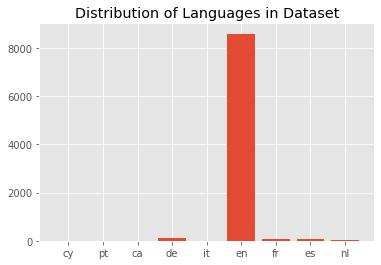

In [20]:
df['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in Dataset")
plt.show()

我们将放弃任何非英语的语言。试图翻译外文时出现了以下问题：
（1）API调用有限
（2）翻译这门语言可能无法传递原文的真正语义

In [21]:
df = df[df['language'] == 'en'] 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8581 entries, 2955 to 7997
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   paper_id             8581 non-null   object
 1   doi                  8581 non-null   object
 2   abstract             8581 non-null   object
 3   body_text            8581 non-null   object
 4   authors              8581 non-null   object
 5   title                8581 non-null   object
 6   journal              8581 non-null   object
 7   abstract_summary     8581 non-null   object
 8   abstract_word_count  8581 non-null   int64 
 9   body_word_count      8581 non-null   int64 
 10  body_unique_words    8581 non-null   int64 
 11  language             8581 non-null   object
dtypes: int64(3), object(9)
memory usage: 871.5+ KB


In [69]:
# Download the spacy bio parser 下载spacy bio解析器
# en_core_sci_lg是一个完整的spaCy管道，用于生物医学数据，词汇约785k，向量约6000k。
from IPython.utils import io
with io.capture_output() as captured: # 捕获stdout和stderr中的那些行
    !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.2.4/en_core_sci_lg-0.2.4.tar.gz

In [71]:
#pip install /Users/yangshoujian/module/en_core_sci_lg-0.2.4.tar.gz

Processing /Users/yangshoujian/module/en_core_sci_lg-0.2.4.tar.gz
  Stored in directory: /Users/yangshoujian/Library/Caches/pip/wheels/29/4d/22/10e2c3dd40b8e6f781639848c4a228e4ad56e028d363a04cb5
Successfully built en-core-sci-lg
Note: you may need to restart the kernel to use updated packages.


In [22]:
#NLP 
#spaCy处理文本的过程是模块化的，当调用nlp处理文本时，spaCy首先将文本标记化以生成Doc对象，然后，依次在几个不同的组件中处理Doc，这也称为处理管道。
#语言模型默认的处理管道依次是：tagger、parser、ner等，每个管道组件返回已处理的Doc，然后将其传递给下一个组件。
import spacy 
from spacy.lang.en.stop_words import STOP_WORDS
import en_core_sci_lg  # model downloaded in previous step

2.停止词

预处理的一部分是查找和删除停止词（在聚类步骤中充当噪声的常用词）。

In [23]:
import string

punctuations = string.punctuation
stopwords = list(STOP_WORDS)
stopwords[:10]

['‘ll',
 'an',
 'anyway',
 'several',
 'forty',
 'three',
 'those',
 'might',
 'too',
 'again']

In [24]:
custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI', 'www'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)

3.创建函数处理文本数据

使用spacy库。此函数将文本转换为小写、删除标点符号，并查找和删除停止词。对于解析器，我们将使用en_core_sci_lg，这是一个处理生物医学、科学或临床文本的模型。

In [25]:
# Parser
#使用spacy.load()函数来加载语言模型，spaCy使用的语言模型是预先训练的统计模型，能够预测语言特征
#对于解析器，我们将使用en_core_sci_lg。这是一个处理生物医学、科学或临床文本的模型。
parser = en_core_sci_lg.load(disable=["tagger", "ner"]) #disable参数是禁用的处理管道列表
parser.max_length = 7000000
#语言模型中预先定义了Language管道，spaCy根据Language管道提供的词汇表来创建分词器，分词器管道是跟Language管道息息相关的一个管道。
#分词器用于把文本分为单词，标点符号，空格等标记，除了使用默认的分词器之外，spaCy允许用户根据需要对分词器进行调整
def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens

将此文本处理函数应用于body_text

In [26]:
%%time
tqdm.pandas()
df["processed_text"] = df["body_text"].progress_apply(spacy_tokenizer)

/Users/yangshoujian/PycharmProjects/tfTest/venv/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
100%|██████████| 8581/8581 [39:08<00:00,  3.65it/s]   

CPU times: user 33min 23s, sys: 5min 10s, total: 38min 33s
Wall time: 39min 8s


查看paper的字数

In [27]:
import seaborn as sns

count      8581.000000
mean       4026.028551
std        4723.082174
min           3.000000
25%        1887.000000
50%        3337.000000
75%        5001.000000
max      232431.000000
Name: body_word_count, dtype: float64

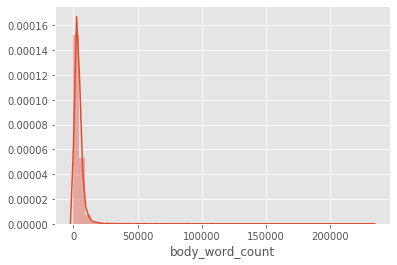

In [28]:
sns.distplot(df['body_word_count'])
df['body_word_count'].describe()

count     8581.000000
mean      1281.007109
std        916.226034
min          3.000000
25%        781.000000
50%       1155.000000
75%       1581.000000
max      30523.000000
Name: body_unique_words, dtype: float64

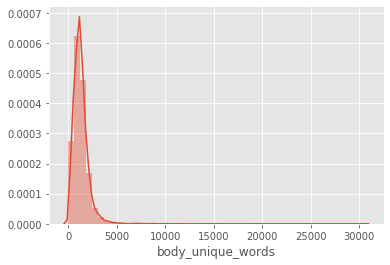

In [29]:
sns.distplot(df['body_unique_words'])
df['body_unique_words'].describe()

In [62]:
df.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words,language,processed_text
2955,1f4a4483baf8fe08dbdb745055c066be6a7405b6,10.1136/gutjnl-2020-321154,,Prevention of nosocomial SARS-CoV-2 transmissi...,"Ong, John. Cross, Gail B. Dan, Yock Young",Prevention of nosocomial SARS-CoV-2<br>transm...,Gut,Not provided.,0,982,578,en,prevention nosocomial sars-cov-2 transmission ...
29938,8c7ae38754e8950db2eca4dc0620168d3475496f,10.1038/srep29430,Recent studies have revealed that the host pro...,Human isolate IBV strains are avirulent but sp...,"Sakai, Kouji. Ami, Yasushi. Nakajima, Norik...",TMPRSS2 Independency for Haemagglutinin<br>Cl...,Sci Rep,Recent studies have revealed that the host<br...,397,1446,537,en,human isolate ibv strain avirulent spread simi...
47384,fdcd6d28e5d3836ebf047b6d2915611000d5615c,10.1016/j.ijheh.2020.113490,,The world is faced with a remarkable outbreak ...,"Jalava, Katri",First respiratory transmitted food borne<br>o...,Int J Hyg Environ Health,Not provided.,0,1332,608,en,world face remarkable outbreak time start wuha...
51650,b16e9ad986a7b19e35e008a79293bba8fb2c6787,10.1155/2018/6289681,We present two probabilistic models to estimat...,Many countries where infectious diseases had b...,"Amaku, Marcos. Coutinho, Francisco Antonio<b...",A Note on the Risk of Infections Invading<br>...,Comput Math Methods Med,We present two probabilistic models to<br>est...,132,4018,1062,en,country infectious disease consider control pa...
51483,69eb669bc39469bb2b7c34b2e1a1e145510709e7,10.1016/j.tvjl.2012.03.008,The aim of this study was to estimate in farme...,The farming of European wild boar (Sus scrofa ...,"Hälli, Outi. Ala-Kurikka, Eve. Nokireki,<br...",Prevalence of and risk factors associated wit...,The Veterinary Journal,The aim of this study was to estimate in farm...,266,2335,979,en,farm european wild boar sus scrofa scrofa grow...


In [65]:
df4 = df

In [66]:
df4.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words,language,processed_text
2955,1f4a4483baf8fe08dbdb745055c066be6a7405b6,10.1136/gutjnl-2020-321154,,Prevention of nosocomial SARS-CoV-2 transmissi...,"Ong, John. Cross, Gail B. Dan, Yock Young",Prevention of nosocomial SARS-CoV-2<br>transm...,Gut,Not provided.,0,982,578,en,prevention nosocomial sars-cov-2 transmission ...
29938,8c7ae38754e8950db2eca4dc0620168d3475496f,10.1038/srep29430,Recent studies have revealed that the host pro...,Human isolate IBV strains are avirulent but sp...,"Sakai, Kouji. Ami, Yasushi. Nakajima, Norik...",TMPRSS2 Independency for Haemagglutinin<br>Cl...,Sci Rep,Recent studies have revealed that the host<br...,397,1446,537,en,human isolate ibv strain avirulent spread simi...
47384,fdcd6d28e5d3836ebf047b6d2915611000d5615c,10.1016/j.ijheh.2020.113490,,The world is faced with a remarkable outbreak ...,"Jalava, Katri",First respiratory transmitted food borne<br>o...,Int J Hyg Environ Health,Not provided.,0,1332,608,en,world face remarkable outbreak time start wuha...
51650,b16e9ad986a7b19e35e008a79293bba8fb2c6787,10.1155/2018/6289681,We present two probabilistic models to estimat...,Many countries where infectious diseases had b...,"Amaku, Marcos. Coutinho, Francisco Antonio<b...",A Note on the Risk of Infections Invading<br>...,Comput Math Methods Med,We present two probabilistic models to<br>est...,132,4018,1062,en,country infectious disease consider control pa...
51483,69eb669bc39469bb2b7c34b2e1a1e145510709e7,10.1016/j.tvjl.2012.03.008,The aim of this study was to estimate in farme...,The farming of European wild boar (Sus scrofa ...,"Hälli, Outi. Ala-Kurikka, Eve. Nokireki,<br...",Prevalence of and risk factors associated wit...,The Veterinary Journal,The aim of this study was to estimate in farm...,266,2335,979,en,farm european wild boar sus scrofa scrofa grow...


In [71]:
print(type(df4['title']))

<class 'pandas.core.series.Series'>


In [78]:
df4['title'] = df4['title'].replace("<br>"," ")

In [73]:
for s in df4['title']:
    s = s.replace("<br>"," ")

In [ ]:
def remove_br(df):
    for i in range(len(df)):
        no_br=df['title'][i].replace("<br>"," ")
        title_clean.append(list(no_br))
    result['title_clean']=title_clean
    result['text_vector']=df3['vector']
    return result
df4_clean = remove_br(df4)

In [77]:
str='erert dgerg<br>fefe hj <br>hk'
str=str.replace("<br>"," ")
str

'erert dgerg fefe hj  hk'

In [79]:
df4.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words,language,processed_text
2955,1f4a4483baf8fe08dbdb745055c066be6a7405b6,10.1136/gutjnl-2020-321154,,Prevention of nosocomial SARS-CoV-2 transmissi...,"Ong, John. Cross, Gail B. Dan, Yock Young",Prevention of nosocomial SARS-CoV-2<br>transm...,Gut,Not provided.,0,982,578,en,prevention nosocomial sars-cov-2 transmission ...
29938,8c7ae38754e8950db2eca4dc0620168d3475496f,10.1038/srep29430,Recent studies have revealed that the host pro...,Human isolate IBV strains are avirulent but sp...,"Sakai, Kouji. Ami, Yasushi. Nakajima, Norik...",TMPRSS2 Independency for Haemagglutinin<br>Cl...,Sci Rep,Recent studies have revealed that the host<br...,397,1446,537,en,human isolate ibv strain avirulent spread simi...
47384,fdcd6d28e5d3836ebf047b6d2915611000d5615c,10.1016/j.ijheh.2020.113490,,The world is faced with a remarkable outbreak ...,"Jalava, Katri",First respiratory transmitted food borne<br>o...,Int J Hyg Environ Health,Not provided.,0,1332,608,en,world face remarkable outbreak time start wuha...
51650,b16e9ad986a7b19e35e008a79293bba8fb2c6787,10.1155/2018/6289681,We present two probabilistic models to estimat...,Many countries where infectious diseases had b...,"Amaku, Marcos. Coutinho, Francisco Antonio<b...",A Note on the Risk of Infections Invading<br>...,Comput Math Methods Med,We present two probabilistic models to<br>est...,132,4018,1062,en,country infectious disease consider control pa...
51483,69eb669bc39469bb2b7c34b2e1a1e145510709e7,10.1016/j.tvjl.2012.03.008,The aim of this study was to estimate in farme...,The farming of European wild boar (Sus scrofa ...,"Hälli, Outi. Ala-Kurikka, Eve. Nokireki,<br...",Prevalence of and risk factors associated wit...,The Veterinary Journal,The aim of this study was to estimate in farm...,266,2335,979,en,farm european wild boar sus scrofa scrofa grow...


In [89]:
df4['processed_text'][2955]

'prevention nosocomial sars-cov-2 transmission endoscopy international recommendation need gold standard 3000 healthcare worker hcw china suspect coronavirus disease 2019 covid-19 1700 test positive 1 statistic underline need robust preventative measure severe acute respiratory syndrome coronavirus 2 sars-cov-2 endoscopy department fertile ground viral spread aerosolisation bodily secretion occur procedure single viral-shedding patient high viral load contaminate entire endoscopy room virus remain viable 3 day putt uninfected patient hcws risk 2 3 singapore previously large cohort covid-19 patient outside china early phasis outbreak given novelty effectiveness new preventative measure implement endoscopy service unknown determine practice conduct systematic search literature official website gastroenterology endoscopy society n=28 15 most-affected country scrutinise recommendation associate evidence methodology available request summary find careful patient selection commonly advise pr

In [90]:
print(type(df4['processed_text'][2955]))
print(type(df4['processed_text']))
print(len(df4['processed_text']))

<class 'str'>
<class 'pandas.core.series.Series'>
8581


In [179]:
import re
processed_text_split=[]
for s in df4['processed_text']:
    s.replace('\n','') #去掉\n
#     pattern = r',|\.|/|;|\'|`|\[|\]|<|>|\?|:|"|\{|\}|\~|!|@|#|\$|%|\^|&|\(|\)|-|=|\_|\+|，|。|、|；|‘|’|【|】|·|！| |…|（|）'
    pattern = r',|;|`|\?|:|"|!|\$|\^|=|\_|，|。|、|；|‘|’|【|】|►|！|…'
    result_list = re.split(pattern, s) #标点符号自动切句的list的每一行纯文本
#     result_list_v1 = filter(lamda x: x, result_list)
    result_list_non_empty = [x for x in result_list if x] #去掉' '空值
    processed_text_split.append(result_list_non_empty)
df4['processed_text_split_sentence']=processed_text_split
df4.head()

,paper_id,doi,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words,language,processed_text,y,processed_text_split,processed_text_split_sentence
2955,1f4a4483baf8fe08dbdb745055c066be6a7405b6,10.1136/gutjnl-2020-321154,,Prevention of nosocomial SARS-CoV-2 transmissi...,"Ong, John. Cross, Gail B. Dan, Yock Young",Prevention of nosocomial SARS-CoV-2<br>transm...,Gut,Not provided.,0,982,578,en,prevention nosocomial sars-cov-2 transmission ...,12,"[prevention, nosocomial, sars-cov-2, transmiss...",[prevention nosocomial sars-cov-2 transmission...
29938,8c7ae38754e8950db2eca4dc0620168d3475496f,10.1038/srep29430,Recent studies have revealed that the host pro...,Human isolate IBV strains are avirulent but sp...,"Sakai, Kouji. Ami, Yasushi. Nakajima, Norik...",TMPRSS2 Independency for Haemagglutinin<br>Cl...,Sci Rep,Recent studies have revealed that the host<br...,397,1446,537,en,human isolate ibv strain avirulent spread simi...,6,"[human, isolate, ibv, strain, avirulent, sprea...",[human isolate ibv strain avirulent spread sim...
47384,fdcd6d28e5d3836ebf047b6d2915611000d5615c,10.1016/j.ijheh.2020.113490,,The world is faced with a remarkable outbreak ...,"Jalava, Katri",First respiratory transmitted food borne<br>o...,Int J Hyg Environ Health,Not provided.,0,1332,608,en,world face remarkable outbreak time start wuha...,7,"[world, face, remarkable, outbreak, time, star...",[world face remarkable outbreak time start wuh...
51650,b16e9ad986a7b19e35e008a79293bba8fb2c6787,10.1155/2018/6289681,We present two probabilistic models to estimat...,Many countries where infectious diseases had b...,"Amaku, Marcos. Coutinho, Francisco Antonio<b...",A Note on the Risk of Infections Invading<br>...,Comput Math Methods Med,We present two probabilistic models to<br>est...,132,4018,1062,en,country infectious disease consider control pa...,4,"[country, infectious, disease, consider, contr...",[country infectious disease consider control p...
51483,69eb669bc39469bb2b7c34b2e1a1e145510709e7,10.1016/j.tvjl.2012.03.008,The aim of this study was to estimate in farme...,The farming of European wild boar (Sus scrofa ...,"Hälli, Outi. Ala-Kurikka, Eve. Nokireki,<br...",Prevalence of and risk factors associated wit...,The Veterinary Journal,The aim of this study was to estimate in farm...,266,2335,979,en,farm european wild boar sus scrofa scrofa grow...,8,"[farm, european, wild, boar, sus, scrofa, scro...",[farm european wild boar sus scrofa scrofa gro...


In [180]:
df4['processed_text_split_sentence'][2955]

['prevention nosocomial sars-cov-2 transmission endoscopy international recommendation need gold standard 3000 healthcare worker hcw china suspect coronavirus disease 2019 covid-19 1700 test positive 1 statistic underline need robust preventative measure severe acute respiratory syndrome coronavirus 2 sars-cov-2 endoscopy department fertile ground viral spread aerosolisation bodily secretion occur procedure single viral-shedding patient high viral load contaminate entire endoscopy room virus remain viable 3 day putt uninfected patient hcws risk 2 3 singapore previously large cohort covid-19 patient outside china early phasis outbreak given novelty effectiveness new preventative measure implement endoscopy service unknown determine practice conduct systematic search literature official website gastroenterology endoscopy society n',
 '28 15 most-affected country scrutinise recommendation associate evidence methodology available request summary find careful patient selection commonly advi

In [ ]:
# get metadata information
    df4 = df4.loc[df4['title'] == df3['title']] # sha==paper_id，loc利用index的名称,来获取想要的行(或列)。
    # no metadata, skip this paper
    if len(df4) == 0:
        continue
     # add the title information, add breaks when needed
    
    try:
        title = get_breaks(df4['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(df4['title'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'doi', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

# 三、向量化

对数据进行了预处理后，将其转换成一种可以由算法处理的格式。我们使用Google已发布的预训练好的Bert模型。bert-as-service大致工作原理就是运行一个服务端，然后客户端通过相应的端口去和服务端交互，从而用向量对句子进行表示。

1.环境准备

In [31]:
pip install bert-serving-server 

    100% |████████████████████████████████| 71kB 48kB/s ta 0:00:01
  Stored in directory: /Users/yangshoujian/Library/Caches/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built GPUtil
Note: you may need to restart the kernel to use updated packages.


In [32]:
pip install bert-serving-client # client, independent of `bert-serving-server`

  Retrying (Retry(total=4, connect=None, read=None, redirect=None, status=None)) after connection broken by 'ConnectTimeoutError(<pip._vendor.urllib3.connection.VerifiedHTTPSConnection object at 0x10bfc12d0>, 'Connection to files.pythonhosted.org timed out. (connect timeout=15)')': /packages/1f/09/aae1405378a848b2e87769ad89a43d6d71978c4e15534ca48e82e723a72f/bert_serving_client-1.10.0-py2.py3-none-any.whl
  Retrying (Retry(total=3, connect=None, read=None, redirect=None, status=None)) after connection broken by 'ConnectTimeoutError(<pip._vendor.urllib3.connection.VerifiedHTTPSConnection object at 0x10bfc18d0>, 'Connection to files.pythonhosted.org timed out. (connect timeout=15)')': /packages/1f/09/aae1405378a848b2e87769ad89a43d6d71978c4e15534ca48e82e723a72f/bert_serving_client-1.10.0-py2.py3-none-any.whl
Note: you may need to restart the kernel to use updated packages.


2.命令行启动bert-serving-server

In [ ]:
which python3 #找python的安装路径
find . -name name #查找文件名
bert-serving-start -model_dir /Users/yangshoujian/module/uncased_L-12_H-768_A-12/ -num_worker=4
python3 bert-serving-start
python3 bert-serving-start -model_dir /Users/yangshoujian/module/uncased_L-12_H-768_A-12 -num_worker=4

In [ ]:
-bash: bert-serving-start: command not found  #出现错误：bert-serving-start: 未找到命令...
#执行命令
find / -name bert-serving-start
#找到：/Users/yangshoujian/PycharmProjects/tfTest/venv/bin/bert-serving-start
#去到/Users/yangshoujian/PycharmProjects/tfTest/venv/bin目录下：
cd /Users/yangshoujian/PycharmProjects/tfTest/venv/bin
./bert-serving-start -model_dir /Users/yangshoujian/module/uncased_L-12_H-768_A-12/ -num_worker=4
pip install tensorflow==版本号
Tensorflow==2.0.0-rc0

3.客户端代码使用

In [82]:
%%time
from bert_serving.client import BertClient
bc = BertClient()
# text = df['processed_text'].values
#将返回一个 ndarray（或 List[List[float]]），其中每一行是表示句子的固定长度矢量。有几千个句子？只需编码！甚至懒得批处理，服务器会处理它。
X = bc.encode(['今天天气很好', '你好', 'then do it better'])#调用bert模型来获取句子向量 
# X = bc.encode(text)
print(type(X)) #ndarray:N维度数组对象
X.shape

<class 'numpy.ndarray'>
CPU times: user 6.41 ms, sys: 94.9 ms, total: 101 ms
Wall time: 2.22 s


(3, 768)

In [181]:
%%time
from bert_serving.client import BertClient
bc = BertClient()
# result_x_v1=bc.encode(df4['processed_text'][2955])
str='prevention nosocomial sars-cov-2 transmission endoscopy international'
result_x_v1=bc.encode(str.split(','))
print(type(result_x_v1))
# m = np.array(result_x_v1)
# m.shape
print(result_x_v1)

<class 'numpy.ndarray'>
[[-5.11493027e-01 -2.35119075e-01  8.93514976e-03 -5.49268663e-01
   8.08051288e-01 -2.72200167e-01 -2.64461964e-01  7.43282974e-01
  -6.79320320e-02 -2.93774456e-01 -2.21313626e-01 -2.28158861e-01
   3.93214002e-02  3.99947464e-01  2.18669444e-01  8.75261188e-01
   9.92482752e-02  1.65123552e-01 -7.30376303e-01 -2.48426870e-02
   3.94340716e-02 -5.57917535e-01 -2.22879767e-01  8.40390205e-01
  -2.84868002e-01 -3.74962777e-01 -2.66497642e-01  5.71408391e-01
  -3.30427149e-03 -8.80717933e-01  3.70395958e-01  4.90583807e-01
  -4.92469549e-01 -4.85577583e-01 -1.81895062e-01 -3.64865549e-02
  -1.63075909e-01  8.38392705e-04  2.57038444e-01  3.67557555e-01
  -6.21095896e-01 -6.98549151e-01 -3.07099760e-01 -4.27202620e-02
   6.48704886e-01 -2.29614768e-02 -2.00697824e-01  1.09183744e-01
   1.57797232e-01 -1.30972043e-01 -5.74828029e-01 -7.90808916e-01
   7.26377591e-02 -5.60313880e-01  2.94849306e-01  7.67104447e-01
  -1.55987874e-01 -5.91381073e-01 -7.54821151e-02 -1

In [102]:
print(type(result_x_v1))
print(result_x_v1.shape)

<class 'numpy.ndarray'>
(1, 768)


In [183]:
%%time
from bert_serving.client import BertClient
bc = BertClient()
vec_x_v1=[]
for s in tqdm(df4['processed_text']):
    s_list = s.split(',') # s_list是['s']的list类型
    s_list_non_empty = [x for x in s_list if x]
    result_x = bc.encode(s_list_non_empty) #result_x是<class 'numpy.ndarray'>类型
    vec_x_v1.append(result_x)
# vec_x.shape




  0%|          | 0/8581 [00:00<?, ?it/s]


  0%|          | 1/8581 [00:00<1:43:48,  1.38it/s]


  0%|          | 2/8581 [00:01<1:44:29,  1.37it/s]


  0%|          | 3/8581 [00:02<1:40:58,  1.42it/s]


  0%|          | 4/8581 [00:06<4:29:59,  1.89s/it]


  0%|          | 5/8581 [00:07<3:36:52,  1.52s/it]


  0%|          | 6/8581 [00:09<3:39:51,  1.54s/it]


  0%|          | 7/8581 [00:10<3:20:53,  1.41s/it]


  0%|          | 8/8581 [00:16<6:44:57,  2.83s/it]


  0%|          | 9/8581 [00:19<6:59:42,  2.94s/it]


  0%|          | 10/8581 [00:20<5:26:32,  2.29s/it]


  0%|          | 11/8581 [00:22<5:17:45,  2.22s/it]


  0%|          | 12/8581 [00:23<4:14:54,  1.78s/it]


  0%|          | 13/8581 [00:23<3:33:38,  1.50s/it]


  0%|          | 14/8581 [00:24<3:02:16,  1.28s/it]


  0%|          | 15/8581 [00:25<2:37:48,  1.11s/it]


  0%|          | 16/8581 [00:31<6:08:14,  2.58s/it]


  0%|          | 17/8581 [00:32<4:50:20,  2.03s/it]


  0%|          | 18/8581 [00:32<3:57:57,  1.6

  2%|▏         | 129/8581 [05:34<4:58:12,  2.12s/it]


  2%|▏         | 130/8581 [05:36<4:46:40,  2.04s/it]


  2%|▏         | 131/8581 [05:39<5:45:48,  2.46s/it]


  2%|▏         | 132/8581 [05:43<6:56:20,  2.96s/it]


  2%|▏         | 133/8581 [05:52<11:26:09,  4.87s/it]


  2%|▏         | 134/8581 [05:54<9:07:10,  3.89s/it] 


  2%|▏         | 135/8581 [05:55<7:09:16,  3.05s/it]


  2%|▏         | 136/8581 [06:00<8:33:42,  3.65s/it]


  2%|▏         | 137/8581 [06:01<6:31:39,  2.78s/it]


  2%|▏         | 138/8581 [06:03<6:20:12,  2.70s/it]


  2%|▏         | 139/8581 [06:07<7:12:56,  3.08s/it]


  2%|▏         | 140/8581 [06:11<7:31:44,  3.21s/it]


  2%|▏         | 141/8581 [06:12<5:47:21,  2.47s/it]


  2%|▏         | 142/8581 [06:13<5:05:14,  2.17s/it]


  2%|▏         | 143/8581 [06:14<4:02:00,  1.72s/it]


  2%|▏         | 144/8581 [06:16<4:18:27,  1.84s/it]


  2%|▏         | 145/8581 [06:17<3:33:49,  1.52s/it]


  2%|▏         | 146/8581 [06:18<3:04:57,  1.32s/it]


  2%|▏  

  3%|▎         | 256/8581 [12:13<3:45:35,  1.63s/it]


  3%|▎         | 257/8581 [12:30<14:38:48,  6.33s/it]


  3%|▎         | 258/8581 [12:31<10:48:45,  4.68s/it]


  3%|▎         | 259/8581 [12:32<8:10:43,  3.54s/it] 


  3%|▎         | 260/8581 [12:40<10:55:02,  4.72s/it]


  3%|▎         | 261/8581 [12:46<11:47:53,  5.11s/it]


  3%|▎         | 262/8581 [12:47<9:17:05,  4.02s/it] 


  3%|▎         | 263/8581 [12:48<7:07:50,  3.09s/it]


  3%|▎         | 264/8581 [12:50<6:24:49,  2.78s/it]


  3%|▎         | 265/8581 [12:51<5:00:05,  2.17s/it]


  3%|▎         | 266/8581 [12:52<4:03:34,  1.76s/it]


  3%|▎         | 267/8581 [12:59<8:02:22,  3.48s/it]


  3%|▎         | 268/8581 [13:00<6:13:16,  2.69s/it]


  3%|▎         | 269/8581 [13:10<10:56:04,  4.74s/it]


  3%|▎         | 270/8581 [13:13<9:53:39,  4.29s/it] 


  3%|▎         | 271/8581 [13:14<7:30:52,  3.26s/it]


  3%|▎         | 272/8581 [13:19<9:01:26,  3.91s/it]


  3%|▎         | 273/8581 [13:21<7:20:28,  3.18s/it]


  

  4%|▍         | 383/8581 [18:32<3:22:17,  1.48s/it]


  4%|▍         | 384/8581 [18:35<4:01:40,  1.77s/it]


  4%|▍         | 385/8581 [18:39<5:33:55,  2.44s/it]


  4%|▍         | 386/8581 [18:44<7:27:29,  3.28s/it]


  5%|▍         | 387/8581 [18:47<7:24:20,  3.25s/it]


  5%|▍         | 388/8581 [18:52<8:36:29,  3.78s/it]


  5%|▍         | 389/8581 [18:54<7:10:49,  3.16s/it]


  5%|▍         | 390/8581 [18:55<5:33:50,  2.45s/it]


  5%|▍         | 391/8581 [18:56<4:35:07,  2.02s/it]


  5%|▍         | 392/8581 [18:56<3:51:45,  1.70s/it]


  5%|▍         | 393/8581 [18:57<3:16:57,  1.44s/it]


  5%|▍         | 394/8581 [18:59<3:29:05,  1.53s/it]


  5%|▍         | 395/8581 [19:06<7:08:39,  3.14s/it]


  5%|▍         | 396/8581 [19:12<8:46:29,  3.86s/it]


  5%|▍         | 397/8581 [19:14<7:51:33,  3.46s/it]


  5%|▍         | 398/8581 [19:15<6:06:35,  2.69s/it]


  5%|▍         | 399/8581 [19:16<4:52:25,  2.14s/it]


  5%|▍         | 400/8581 [19:19<5:51:30,  2.58s/it]


  5%|▍    

  6%|▌         | 510/8581 [24:47<16:07:30,  7.19s/it]


  6%|▌         | 511/8581 [24:49<12:56:56,  5.78s/it]


  6%|▌         | 512/8581 [24:50<9:43:52,  4.34s/it] 


  6%|▌         | 513/8581 [24:51<7:25:49,  3.32s/it]


  6%|▌         | 514/8581 [24:54<7:15:11,  3.24s/it]


  6%|▌         | 515/8581 [25:04<11:50:22,  5.28s/it]


  6%|▌         | 516/8581 [25:08<10:26:09,  4.66s/it]


  6%|▌         | 517/8581 [25:13<10:52:30,  4.85s/it]


  6%|▌         | 518/8581 [25:16<9:50:18,  4.39s/it] 


  6%|▌         | 519/8581 [25:21<10:09:43,  4.54s/it]


  6%|▌         | 520/8581 [25:23<8:25:59,  3.77s/it] 


  6%|▌         | 521/8581 [25:24<6:30:46,  2.91s/it]


  6%|▌         | 522/8581 [25:26<5:43:20,  2.56s/it]


  6%|▌         | 523/8581 [25:27<5:01:28,  2.24s/it]


  6%|▌         | 524/8581 [25:30<5:12:50,  2.33s/it]


  6%|▌         | 525/8581 [25:32<5:17:09,  2.36s/it]


  6%|▌         | 526/8581 [25:33<4:18:00,  1.92s/it]


  6%|▌         | 527/8581 [25:52<15:57:38,  7.13s/it]




  7%|▋         | 637/8581 [30:55<3:16:15,  1.48s/it]


  7%|▋         | 638/8581 [30:59<4:25:24,  2.00s/it]


  7%|▋         | 639/8581 [31:02<5:37:46,  2.55s/it]


  7%|▋         | 640/8581 [31:03<4:28:40,  2.03s/it]


  7%|▋         | 641/8581 [31:04<3:43:49,  1.69s/it]


  7%|▋         | 642/8581 [31:08<5:14:04,  2.37s/it]


  7%|▋         | 643/8581 [31:09<4:11:10,  1.90s/it]


  8%|▊         | 644/8581 [31:11<4:04:02,  1.84s/it]


  8%|▊         | 645/8581 [31:34<18:14:30,  8.28s/it]


  8%|▊         | 646/8581 [31:35<13:23:59,  6.08s/it]


  8%|▊         | 647/8581 [31:41<13:23:36,  6.08s/it]


  8%|▊         | 648/8581 [31:43<10:30:59,  4.77s/it]


  8%|▊         | 649/8581 [31:43<7:53:50,  3.58s/it] 


  8%|▊         | 650/8581 [31:46<6:59:51,  3.18s/it]


  8%|▊         | 651/8581 [31:46<5:27:14,  2.48s/it]


  8%|▊         | 652/8581 [31:47<4:29:02,  2.04s/it]


  8%|▊         | 653/8581 [31:48<3:40:07,  1.67s/it]


  8%|▊         | 654/8581 [31:49<3:05:28,  1.40s/it]


  8%|

  9%|▉         | 764/8581 [36:42<3:01:12,  1.39s/it]


  9%|▉         | 765/8581 [37:11<21:21:30,  9.84s/it]


  9%|▉         | 766/8581 [37:12<15:30:34,  7.14s/it]


  9%|▉         | 767/8581 [37:15<12:21:19,  5.69s/it]


  9%|▉         | 768/8581 [37:23<14:00:26,  6.45s/it]


  9%|▉         | 769/8581 [37:24<10:19:51,  4.76s/it]


  9%|▉         | 770/8581 [37:25<7:46:50,  3.59s/it] 


  9%|▉         | 771/8581 [37:26<6:26:09,  2.97s/it]


  9%|▉         | 772/8581 [37:27<4:59:45,  2.30s/it]


  9%|▉         | 773/8581 [37:28<4:03:29,  1.87s/it]


  9%|▉         | 774/8581 [37:28<3:20:31,  1.54s/it]


  9%|▉         | 775/8581 [37:34<5:50:50,  2.70s/it]


  9%|▉         | 776/8581 [37:35<4:33:17,  2.10s/it]


  9%|▉         | 777/8581 [37:37<5:04:09,  2.34s/it]


  9%|▉         | 778/8581 [37:39<4:37:54,  2.14s/it]


  9%|▉         | 779/8581 [37:40<3:47:46,  1.75s/it]


  9%|▉         | 780/8581 [37:41<3:13:23,  1.49s/it]


  9%|▉         | 781/8581 [37:42<2:48:46,  1.30s/it]


  9%

 10%|█         | 891/8581 [43:32<4:10:49,  1.96s/it]


 10%|█         | 892/8581 [43:32<3:27:43,  1.62s/it]


 10%|█         | 893/8581 [43:33<2:54:45,  1.36s/it]


 10%|█         | 894/8581 [43:38<5:27:33,  2.56s/it]


 10%|█         | 895/8581 [43:40<4:46:23,  2.24s/it]


 10%|█         | 896/8581 [43:43<5:01:25,  2.35s/it]


 10%|█         | 897/8581 [43:43<4:03:47,  1.90s/it]


 10%|█         | 898/8581 [43:44<3:24:05,  1.59s/it]


 10%|█         | 899/8581 [44:01<13:00:53,  6.10s/it]


 10%|█         | 900/8581 [44:02<9:49:03,  4.60s/it] 


 10%|█         | 901/8581 [44:03<7:27:47,  3.50s/it]


 11%|█         | 902/8581 [44:05<6:50:14,  3.21s/it]


 11%|█         | 903/8581 [44:06<5:19:36,  2.50s/it]


 11%|█         | 904/8581 [44:08<4:54:03,  2.30s/it]


 11%|█         | 905/8581 [44:13<6:33:15,  3.07s/it]


 11%|█         | 906/8581 [44:14<5:08:01,  2.41s/it]


 11%|█         | 907/8581 [44:15<4:06:12,  1.92s/it]


 11%|█         | 908/8581 [44:17<4:15:48,  2.00s/it]


 11%|█  

 12%|█▏        | 1018/8581 [50:36<3:41:58,  1.76s/it]


 12%|█▏        | 1019/8581 [50:44<7:30:43,  3.58s/it]


 12%|█▏        | 1020/8581 [50:45<5:46:30,  2.75s/it]


 12%|█▏        | 1021/8581 [50:46<4:34:48,  2.18s/it]


 12%|█▏        | 1022/8581 [50:47<3:44:58,  1.79s/it]


 12%|█▏        | 1023/8581 [50:47<3:06:48,  1.48s/it]


 12%|█▏        | 1024/8581 [50:54<6:23:20,  3.04s/it]


 12%|█▏        | 1025/8581 [50:57<6:22:42,  3.04s/it]


 12%|█▏        | 1026/8581 [51:02<7:25:49,  3.54s/it]


 12%|█▏        | 1027/8581 [51:03<5:43:09,  2.73s/it]


 12%|█▏        | 1028/8581 [51:03<4:32:22,  2.16s/it]


 12%|█▏        | 1029/8581 [51:04<3:43:10,  1.77s/it]


 12%|█▏        | 1030/8581 [51:05<3:09:24,  1.50s/it]


 12%|█▏        | 1031/8581 [51:06<2:44:49,  1.31s/it]


 12%|█▏        | 1032/8581 [51:07<2:31:37,  1.21s/it]


 12%|█▏        | 1033/8581 [51:08<2:18:18,  1.10s/it]


 12%|█▏        | 1034/8581 [51:09<2:06:55,  1.01s/it]


 12%|█▏        | 1035/8581 [51:11<2:59:32,  1.43

 13%|█▎        | 1143/8581 [56:33<5:15:12,  2.54s/it]


 13%|█▎        | 1144/8581 [56:34<4:12:39,  2.04s/it]


 13%|█▎        | 1145/8581 [56:37<4:57:00,  2.40s/it]


 13%|█▎        | 1146/8581 [56:55<14:29:07,  7.01s/it]


 13%|█▎        | 1147/8581 [57:01<13:55:53,  6.75s/it]


 13%|█▎        | 1148/8581 [57:04<11:54:05,  5.76s/it]


 13%|█▎        | 1149/8581 [57:07<10:24:12,  5.04s/it]


 13%|█▎        | 1150/8581 [57:15<12:03:03,  5.84s/it]


 13%|█▎        | 1151/8581 [57:18<9:55:45,  4.81s/it] 


 13%|█▎        | 1152/8581 [57:19<7:32:04,  3.65s/it]


 13%|█▎        | 1153/8581 [57:19<5:50:30,  2.83s/it]


 13%|█▎        | 1154/8581 [57:29<9:48:46,  4.76s/it]


 13%|█▎        | 1155/8581 [58:14<35:00:39, 16.97s/it]


 13%|█▎        | 1156/8581 [58:15<25:09:58, 12.20s/it]


 13%|█▎        | 1157/8581 [58:18<19:08:17,  9.28s/it]


 13%|█▎        | 1158/8581 [58:22<16:15:21,  7.88s/it]


 14%|█▎        | 1159/8581 [58:32<17:33:21,  8.52s/it]


 14%|█▎        | 1160/8581 [58:37<15:

 15%|█▍        | 1265/8581 [1:04:14<2:54:56,  1.43s/it]


 15%|█▍        | 1266/8581 [1:04:16<2:59:10,  1.47s/it]


 15%|█▍        | 1267/8581 [1:04:17<2:37:16,  1.29s/it]


 15%|█▍        | 1268/8581 [1:04:43<17:47:40,  8.76s/it]


 15%|█▍        | 1269/8581 [1:04:44<12:58:13,  6.39s/it]


 15%|█▍        | 1270/8581 [1:04:48<11:28:07,  5.65s/it]


 15%|█▍        | 1271/8581 [1:04:48<8:30:28,  4.19s/it] 


 15%|█▍        | 1272/8581 [1:04:50<6:57:20,  3.43s/it]


 15%|█▍        | 1273/8581 [1:04:52<6:14:58,  3.08s/it]


 15%|█▍        | 1274/8581 [1:04:53<4:56:21,  2.43s/it]


 15%|█▍        | 1275/8581 [1:04:56<4:52:24,  2.40s/it]


 15%|█▍        | 1276/8581 [1:04:59<5:39:43,  2.79s/it]


 15%|█▍        | 1277/8581 [1:05:05<7:23:50,  3.65s/it]


 15%|█▍        | 1278/8581 [1:05:07<6:19:10,  3.12s/it]


 15%|█▍        | 1279/8581 [1:05:08<4:58:59,  2.46s/it]


 15%|█▍        | 1280/8581 [1:05:09<4:05:58,  2.02s/it]


 15%|█▍        | 1281/8581 [1:05:11<4:09:04,  2.05s/it]


 15%|█▍   

 16%|█▌        | 1387/8581 [1:10:27<3:53:21,  1.95s/it]


 16%|█▌        | 1388/8581 [1:10:28<3:15:59,  1.63s/it]


 16%|█▌        | 1389/8581 [1:10:30<3:36:38,  1.81s/it]


 16%|█▌        | 1390/8581 [1:10:31<3:02:42,  1.52s/it]


 16%|█▌        | 1391/8581 [1:10:33<3:30:07,  1.75s/it]


 16%|█▌        | 1392/8581 [1:10:34<2:55:01,  1.46s/it]


 16%|█▌        | 1393/8581 [1:10:35<2:32:36,  1.27s/it]


 16%|█▌        | 1394/8581 [1:10:38<3:28:22,  1.74s/it]


 16%|█▋        | 1395/8581 [1:10:41<4:06:07,  2.06s/it]


 16%|█▋        | 1396/8581 [1:10:42<3:50:07,  1.92s/it]


 16%|█▋        | 1397/8581 [1:10:49<6:55:51,  3.47s/it]


 16%|█▋        | 1398/8581 [1:10:52<6:11:25,  3.10s/it]


 16%|█▋        | 1399/8581 [1:10:52<4:48:28,  2.41s/it]


 16%|█▋        | 1400/8581 [1:10:53<3:51:23,  1.93s/it]


 16%|█▋        | 1401/8581 [1:10:57<5:00:20,  2.51s/it]


 16%|█▋        | 1402/8581 [1:10:58<4:02:58,  2.03s/it]


 16%|█▋        | 1403/8581 [1:11:00<3:48:13,  1.91s/it]


 16%|█▋       

 18%|█▊        | 1509/8581 [1:15:13<4:51:53,  2.48s/it]


 18%|█▊        | 1510/8581 [1:15:14<3:56:43,  2.01s/it]


 18%|█▊        | 1511/8581 [1:15:15<3:19:12,  1.69s/it]


 18%|█▊        | 1512/8581 [1:15:23<7:02:37,  3.59s/it]


 18%|█▊        | 1513/8581 [1:15:24<5:27:02,  2.78s/it]


 18%|█▊        | 1514/8581 [1:15:26<5:08:22,  2.62s/it]


 18%|█▊        | 1515/8581 [1:15:27<4:09:21,  2.12s/it]


 18%|█▊        | 1516/8581 [1:15:31<4:52:11,  2.48s/it]


 18%|█▊        | 1517/8581 [1:15:31<3:56:00,  2.00s/it]


 18%|█▊        | 1518/8581 [1:15:34<4:05:14,  2.08s/it]


 18%|█▊        | 1519/8581 [1:15:36<4:07:41,  2.10s/it]


 18%|█▊        | 1520/8581 [1:15:39<4:31:47,  2.31s/it]


 18%|█▊        | 1521/8581 [1:15:40<4:06:46,  2.10s/it]


 18%|█▊        | 1522/8581 [1:15:41<3:17:46,  1.68s/it]


 18%|█▊        | 1523/8581 [1:15:42<3:04:57,  1.57s/it]


 18%|█▊        | 1524/8581 [1:15:43<2:41:50,  1.38s/it]


 18%|█▊        | 1525/8581 [1:16:40<35:26:22, 18.08s/it]


 18%|█▊      

 19%|█▉        | 1630/8581 [1:27:36<2:35:18,  1.34s/it]


 19%|█▉        | 1631/8581 [1:27:37<2:17:14,  1.18s/it]


 19%|█▉        | 1632/8581 [1:27:38<2:24:20,  1.25s/it]


 19%|█▉        | 1633/8581 [1:27:40<2:34:42,  1.34s/it]


 19%|█▉        | 1634/8581 [1:27:41<2:17:43,  1.19s/it]


 19%|█▉        | 1635/8581 [1:27:43<2:53:37,  1.50s/it]


 19%|█▉        | 1636/8581 [1:27:46<4:09:20,  2.15s/it]


 19%|█▉        | 1637/8581 [1:27:53<6:51:32,  3.56s/it]


 19%|█▉        | 1638/8581 [1:27:54<5:13:32,  2.71s/it]


 19%|█▉        | 1639/8581 [1:27:55<4:08:00,  2.14s/it]


 19%|█▉        | 1640/8581 [1:27:56<3:20:25,  1.73s/it]


 19%|█▉        | 1641/8581 [1:28:01<5:32:19,  2.87s/it]


 19%|█▉        | 1642/8581 [1:28:02<4:20:25,  2.25s/it]


 19%|█▉        | 1643/8581 [1:28:03<3:34:07,  1.85s/it]


 19%|█▉        | 1644/8581 [1:28:05<3:27:17,  1.79s/it]


 19%|█▉        | 1645/8581 [1:28:05<2:53:10,  1.50s/it]


 19%|█▉        | 1646/8581 [1:28:07<2:54:16,  1.51s/it]


 19%|█▉       

 20%|██        | 1751/8581 [1:34:27<7:08:33,  3.76s/it]


 20%|██        | 1752/8581 [1:34:28<5:27:26,  2.88s/it]


 20%|██        | 1753/8581 [1:34:33<6:49:26,  3.60s/it]


 20%|██        | 1754/8581 [1:34:34<5:11:09,  2.73s/it]


 20%|██        | 1755/8581 [1:34:35<4:30:04,  2.37s/it]


 20%|██        | 1756/8581 [1:34:36<3:33:01,  1.87s/it]


 20%|██        | 1757/8581 [1:34:37<2:56:05,  1.55s/it]


 20%|██        | 1758/8581 [1:34:38<2:28:45,  1.31s/it]


 20%|██        | 1759/8581 [1:34:38<2:14:05,  1.18s/it]


 21%|██        | 1760/8581 [1:34:40<2:24:08,  1.27s/it]


 21%|██        | 1761/8581 [1:34:42<2:58:35,  1.57s/it]


 21%|██        | 1762/8581 [1:34:43<2:30:47,  1.33s/it]


 21%|██        | 1763/8581 [1:34:44<2:12:35,  1.17s/it]


 21%|██        | 1764/8581 [1:34:45<1:58:38,  1.04s/it]


 21%|██        | 1765/8581 [1:34:47<2:36:17,  1.38s/it]


 21%|██        | 1766/8581 [1:34:47<2:15:08,  1.19s/it]


 21%|██        | 1767/8581 [1:34:48<2:02:26,  1.08s/it]


 21%|██       

 22%|██▏       | 1873/8581 [1:40:20<5:44:47,  3.08s/it]


 22%|██▏       | 1874/8581 [1:40:23<6:00:24,  3.22s/it]


 22%|██▏       | 1875/8581 [1:40:30<7:42:50,  4.14s/it]


 22%|██▏       | 1876/8581 [1:40:30<5:48:25,  3.12s/it]


 22%|██▏       | 1877/8581 [1:40:31<4:30:15,  2.42s/it]


 22%|██▏       | 1878/8581 [1:40:32<3:33:08,  1.91s/it]


 22%|██▏       | 1879/8581 [1:40:38<5:40:51,  3.05s/it]


 22%|██▏       | 1880/8581 [1:40:38<4:23:39,  2.36s/it]


 22%|██▏       | 1881/8581 [1:40:40<3:57:09,  2.12s/it]


 22%|██▏       | 1882/8581 [1:40:49<7:36:00,  4.08s/it]


 22%|██▏       | 1883/8581 [1:40:49<5:45:05,  3.09s/it]


 22%|██▏       | 1884/8581 [1:40:51<4:53:56,  2.63s/it]


 22%|██▏       | 1885/8581 [1:40:56<6:08:42,  3.30s/it]


 22%|██▏       | 1886/8581 [1:41:03<8:21:14,  4.49s/it]


 22%|██▏       | 1887/8581 [1:41:05<6:41:56,  3.60s/it]


 22%|██▏       | 1888/8581 [1:41:06<5:29:35,  2.95s/it]


 22%|██▏       | 1889/8581 [1:41:08<5:05:21,  2.74s/it]


 22%|██▏      

 23%|██▎       | 1995/8581 [1:46:54<4:34:31,  2.50s/it]


 23%|██▎       | 1996/8581 [1:46:55<3:39:14,  2.00s/it]


 23%|██▎       | 1997/8581 [1:46:56<3:01:39,  1.66s/it]


 23%|██▎       | 1998/8581 [1:46:58<3:25:52,  1.88s/it]


 23%|██▎       | 1999/8581 [1:46:59<2:48:46,  1.54s/it]


 23%|██▎       | 2000/8581 [1:47:00<2:47:00,  1.52s/it]


 23%|██▎       | 2001/8581 [1:47:01<2:23:08,  1.31s/it]


 23%|██▎       | 2002/8581 [1:47:03<2:25:37,  1.33s/it]


 23%|██▎       | 2003/8581 [1:47:06<3:18:26,  1.81s/it]


 23%|██▎       | 2004/8581 [1:47:10<5:01:16,  2.75s/it]


 23%|██▎       | 2005/8581 [1:47:12<4:18:59,  2.36s/it]


 23%|██▎       | 2006/8581 [1:47:13<3:27:27,  1.89s/it]


 23%|██▎       | 2007/8581 [1:47:16<4:16:50,  2.34s/it]


 23%|██▎       | 2008/8581 [1:47:24<7:22:55,  4.04s/it]


 23%|██▎       | 2009/8581 [1:47:25<5:37:34,  3.08s/it]


 23%|██▎       | 2010/8581 [1:47:27<4:49:09,  2.64s/it]


 23%|██▎       | 2011/8581 [1:47:27<3:49:23,  2.09s/it]


 23%|██▎      

 25%|██▍       | 2116/8581 [1:53:29<4:20:13,  2.42s/it]


 25%|██▍       | 2117/8581 [1:53:31<3:55:45,  2.19s/it]


 25%|██▍       | 2118/8581 [1:53:32<3:09:18,  1.76s/it]


 25%|██▍       | 2119/8581 [1:53:42<7:48:32,  4.35s/it]


 25%|██▍       | 2120/8581 [1:53:58<13:56:04,  7.76s/it]


 25%|██▍       | 2121/8581 [1:53:59<10:10:21,  5.67s/it]


 25%|██▍       | 2122/8581 [1:54:03<9:33:28,  5.33s/it] 


 25%|██▍       | 2123/8581 [1:54:04<7:10:26,  4.00s/it]


 25%|██▍       | 2124/8581 [1:54:05<5:28:21,  3.05s/it]


 25%|██▍       | 2125/8581 [1:54:06<4:14:23,  2.36s/it]


 25%|██▍       | 2126/8581 [1:54:08<4:29:56,  2.51s/it]


 25%|██▍       | 2127/8581 [1:54:11<4:41:33,  2.62s/it]


 25%|██▍       | 2128/8581 [1:54:13<4:08:36,  2.31s/it]


 25%|██▍       | 2129/8581 [1:54:15<3:45:15,  2.09s/it]


 25%|██▍       | 2130/8581 [1:54:16<3:27:16,  1.93s/it]


 25%|██▍       | 2131/8581 [1:54:17<3:09:35,  1.76s/it]


 25%|██▍       | 2132/8581 [1:54:19<3:02:55,  1.70s/it]


 25%|██▍   

 26%|██▌       | 2238/8581 [2:00:06<6:06:37,  3.47s/it]


 26%|██▌       | 2239/8581 [2:00:09<5:51:50,  3.33s/it]


 26%|██▌       | 2240/8581 [2:00:10<4:35:24,  2.61s/it]


 26%|██▌       | 2241/8581 [2:00:13<4:31:24,  2.57s/it]


 26%|██▌       | 2242/8581 [2:00:13<3:36:15,  2.05s/it]


 26%|██▌       | 2243/8581 [2:00:20<6:10:14,  3.50s/it]


 26%|██▌       | 2244/8581 [2:00:21<4:44:14,  2.69s/it]


 26%|██▌       | 2245/8581 [2:00:23<4:33:07,  2.59s/it]


 26%|██▌       | 2246/8581 [2:00:25<4:00:15,  2.28s/it]


 26%|██▌       | 2247/8581 [2:00:26<3:13:43,  1.84s/it]


 26%|██▌       | 2248/8581 [2:00:27<2:41:30,  1.53s/it]


 26%|██▌       | 2249/8581 [2:00:29<3:23:00,  1.92s/it]


 26%|██▌       | 2250/8581 [2:00:30<2:44:14,  1.56s/it]


 26%|██▌       | 2251/8581 [2:00:31<2:17:12,  1.30s/it]


 26%|██▌       | 2252/8581 [2:00:32<2:22:48,  1.35s/it]


 26%|██▋       | 2253/8581 [2:00:33<2:01:27,  1.15s/it]


 26%|██▋       | 2254/8581 [2:00:35<2:33:08,  1.45s/it]


 26%|██▋      

 28%|██▊       | 2360/8581 [2:05:51<7:08:22,  4.13s/it]


 28%|██▊       | 2361/8581 [2:05:52<5:23:47,  3.12s/it]


 28%|██▊       | 2362/8581 [2:05:54<5:09:57,  2.99s/it]


 28%|██▊       | 2363/8581 [2:05:56<4:36:53,  2.67s/it]


 28%|██▊       | 2364/8581 [2:06:04<7:27:13,  4.32s/it]


 28%|██▊       | 2365/8581 [2:06:05<5:50:09,  3.38s/it]


 28%|██▊       | 2366/8581 [2:06:07<4:38:10,  2.69s/it]


 28%|██▊       | 2367/8581 [2:06:08<3:47:29,  2.20s/it]


 28%|██▊       | 2368/8581 [2:06:10<3:38:31,  2.11s/it]


 28%|██▊       | 2369/8581 [2:06:10<3:02:05,  1.76s/it]


 28%|██▊       | 2370/8581 [2:06:11<2:37:37,  1.52s/it]


 28%|██▊       | 2371/8581 [2:06:16<4:04:41,  2.36s/it]


 28%|██▊       | 2372/8581 [2:06:17<3:17:08,  1.90s/it]


 28%|██▊       | 2373/8581 [2:06:20<4:02:30,  2.34s/it]


 28%|██▊       | 2374/8581 [2:06:24<4:42:31,  2.73s/it]


 28%|██▊       | 2375/8581 [2:06:24<3:44:51,  2.17s/it]


 28%|██▊       | 2376/8581 [2:06:29<4:57:46,  2.88s/it]


 28%|██▊      

 29%|██▉       | 2482/8581 [2:11:23<2:51:37,  1.69s/it]


 29%|██▉       | 2483/8581 [2:11:24<2:25:09,  1.43s/it]


 29%|██▉       | 2484/8581 [2:11:32<5:32:42,  3.27s/it]


 29%|██▉       | 2485/8581 [2:11:33<4:37:09,  2.73s/it]


 29%|██▉       | 2486/8581 [2:11:34<3:38:36,  2.15s/it]


 29%|██▉       | 2487/8581 [2:11:35<3:18:07,  1.95s/it]


 29%|██▉       | 2488/8581 [2:11:36<2:42:37,  1.60s/it]


 29%|██▉       | 2489/8581 [2:11:37<2:18:47,  1.37s/it]


 29%|██▉       | 2490/8581 [2:11:38<2:01:31,  1.20s/it]


 29%|██▉       | 2491/8581 [2:11:43<4:16:43,  2.53s/it]


 29%|██▉       | 2492/8581 [2:11:44<3:21:23,  1.98s/it]


 29%|██▉       | 2493/8581 [2:11:49<4:49:33,  2.85s/it]


 29%|██▉       | 2494/8581 [2:11:59<8:26:06,  4.99s/it]


 29%|██▉       | 2495/8581 [2:12:02<7:36:49,  4.50s/it]


 29%|██▉       | 2496/8581 [2:12:03<5:45:01,  3.40s/it]


 29%|██▉       | 2497/8581 [2:12:08<6:42:36,  3.97s/it]


 29%|██▉       | 2498/8581 [2:12:10<5:23:44,  3.19s/it]


 29%|██▉      

 30%|███       | 2604/8581 [2:18:02<2:30:05,  1.51s/it]


 30%|███       | 2605/8581 [2:18:03<2:06:57,  1.27s/it]


 30%|███       | 2606/8581 [2:18:05<2:32:09,  1.53s/it]


 30%|███       | 2607/8581 [2:18:06<2:08:55,  1.29s/it]


 30%|███       | 2608/8581 [2:18:06<1:54:03,  1.15s/it]


 30%|███       | 2609/8581 [2:18:09<2:50:34,  1.71s/it]


 30%|███       | 2610/8581 [2:18:13<3:30:18,  2.11s/it]


 30%|███       | 2611/8581 [2:18:13<2:48:11,  1.69s/it]


 30%|███       | 2612/8581 [2:18:15<2:45:15,  1.66s/it]


 30%|███       | 2613/8581 [2:18:16<2:18:50,  1.40s/it]


 30%|███       | 2614/8581 [2:18:19<3:15:15,  1.96s/it]


 30%|███       | 2615/8581 [2:18:20<2:58:42,  1.80s/it]


 30%|███       | 2616/8581 [2:18:22<2:45:52,  1.67s/it]


 30%|███       | 2617/8581 [2:18:35<8:19:29,  5.03s/it]


 31%|███       | 2618/8581 [2:18:36<6:32:18,  3.95s/it]


 31%|███       | 2619/8581 [2:18:42<7:27:41,  4.51s/it]


 31%|███       | 2620/8581 [2:18:43<5:36:45,  3.39s/it]


 31%|███      

 32%|███▏      | 2726/8581 [2:23:27<3:42:12,  2.28s/it]


 32%|███▏      | 2727/8581 [2:23:28<3:24:01,  2.09s/it]


 32%|███▏      | 2728/8581 [2:23:31<3:23:38,  2.09s/it]


 32%|███▏      | 2729/8581 [2:23:33<3:21:16,  2.06s/it]


 32%|███▏      | 2730/8581 [2:23:34<3:02:07,  1.87s/it]


 32%|███▏      | 2731/8581 [2:23:35<2:29:53,  1.54s/it]


 32%|███▏      | 2732/8581 [2:23:36<2:08:33,  1.32s/it]


 32%|███▏      | 2733/8581 [2:23:37<2:15:51,  1.39s/it]


 32%|███▏      | 2734/8581 [2:23:39<2:19:36,  1.43s/it]


 32%|███▏      | 2735/8581 [2:23:39<2:01:35,  1.25s/it]


 32%|███▏      | 2736/8581 [2:23:40<1:47:57,  1.11s/it]


 32%|███▏      | 2737/8581 [2:23:42<2:02:41,  1.26s/it]


 32%|███▏      | 2738/8581 [2:23:43<2:10:23,  1.34s/it]


 32%|███▏      | 2739/8581 [2:23:44<1:55:55,  1.19s/it]


 32%|███▏      | 2740/8581 [2:23:45<1:41:34,  1.04s/it]


 32%|███▏      | 2741/8581 [2:23:48<2:32:12,  1.56s/it]


 32%|███▏      | 2742/8581 [2:23:56<5:54:49,  3.65s/it]


 32%|███▏     

 33%|███▎      | 2848/8581 [2:28:07<2:27:28,  1.54s/it]


 33%|███▎      | 2849/8581 [2:28:07<2:03:33,  1.29s/it]


 33%|███▎      | 2850/8581 [2:28:08<1:48:22,  1.13s/it]


 33%|███▎      | 2851/8581 [2:28:09<1:36:29,  1.01s/it]


 33%|███▎      | 2852/8581 [2:28:11<2:07:46,  1.34s/it]


 33%|███▎      | 2853/8581 [2:28:12<1:51:42,  1.17s/it]


 33%|███▎      | 2854/8581 [2:28:13<2:01:00,  1.27s/it]


 33%|███▎      | 2855/8581 [2:28:14<1:47:17,  1.12s/it]


 33%|███▎      | 2856/8581 [2:29:15<30:21:01, 19.08s/it]


 33%|███▎      | 2857/8581 [2:29:26<26:24:09, 16.61s/it]


 33%|███▎      | 2858/8581 [2:31:43<84:02:47, 52.87s/it]


 33%|███▎      | 2859/8581 [2:31:47<60:31:10, 38.08s/it]


 33%|███▎      | 2860/8581 [2:32:06<51:18:58, 32.29s/it]


 33%|███▎      | 2861/8581 [2:32:09<37:19:03, 23.49s/it]


 33%|███▎      | 2862/8581 [2:32:09<26:28:01, 16.66s/it]


 33%|███▎      | 2863/8581 [2:32:27<26:55:41, 16.95s/it]


 33%|███▎      | 2864/8581 [2:32:29<19:57:44, 12.57s/it]


 33%|

 35%|███▍      | 2970/8581 [2:37:00<4:11:47,  2.69s/it]


 35%|███▍      | 2971/8581 [2:37:05<5:10:06,  3.32s/it]


 35%|███▍      | 2972/8581 [2:37:06<3:59:44,  2.56s/it]


 35%|███▍      | 2973/8581 [2:37:07<3:12:44,  2.06s/it]


 35%|███▍      | 2974/8581 [2:37:07<2:37:40,  1.69s/it]


 35%|███▍      | 2975/8581 [2:37:08<2:13:32,  1.43s/it]


 35%|███▍      | 2976/8581 [2:37:11<2:56:35,  1.89s/it]


 35%|███▍      | 2977/8581 [2:37:15<3:56:40,  2.53s/it]


 35%|███▍      | 2978/8581 [2:37:16<3:05:01,  1.98s/it]


 35%|███▍      | 2979/8581 [2:37:19<3:26:33,  2.21s/it]


 35%|███▍      | 2980/8581 [2:37:20<3:08:16,  2.02s/it]


 35%|███▍      | 2981/8581 [2:37:21<2:33:05,  1.64s/it]


 35%|███▍      | 2982/8581 [2:37:22<2:08:55,  1.38s/it]


 35%|███▍      | 2983/8581 [2:37:23<2:15:50,  1.46s/it]


 35%|███▍      | 2984/8581 [2:37:24<1:59:10,  1.28s/it]


 35%|███▍      | 2985/8581 [2:37:26<2:03:12,  1.32s/it]


 35%|███▍      | 2986/8581 [2:37:27<2:03:51,  1.33s/it]


 35%|███▍     

 36%|███▌      | 3092/8581 [2:41:54<4:35:52,  3.02s/it]


 36%|███▌      | 3093/8581 [2:42:38<23:16:22, 15.27s/it]


 36%|███▌      | 3094/8581 [2:42:40<16:56:16, 11.11s/it]


 36%|███▌      | 3095/8581 [2:42:42<13:08:36,  8.62s/it]


 36%|███▌      | 3096/8581 [2:42:43<9:32:32,  6.26s/it] 


 36%|███▌      | 3097/8581 [2:42:50<9:51:27,  6.47s/it]


 36%|███▌      | 3098/8581 [2:42:55<8:56:25,  5.87s/it]


 36%|███▌      | 3099/8581 [2:42:56<6:39:03,  4.37s/it]


 36%|███▌      | 3100/8581 [2:43:03<7:51:44,  5.16s/it]


 36%|███▌      | 3101/8581 [2:43:03<5:51:20,  3.85s/it]


 36%|███▌      | 3102/8581 [2:43:05<4:52:05,  3.20s/it]


 36%|███▌      | 3103/8581 [2:43:06<3:46:35,  2.48s/it]


 36%|███▌      | 3104/8581 [2:43:07<3:01:28,  1.99s/it]


 36%|███▌      | 3105/8581 [2:43:07<2:28:20,  1.63s/it]


 36%|███▌      | 3106/8581 [2:43:10<2:46:36,  1.83s/it]


 36%|███▌      | 3107/8581 [2:43:14<3:48:55,  2.51s/it]


 36%|███▌      | 3108/8581 [2:43:15<3:23:01,  2.23s/it]


 36%|███▌ 

 37%|███▋      | 3213/8581 [2:50:59<6:51:33,  4.60s/it]


 37%|███▋      | 3214/8581 [2:51:00<5:09:57,  3.47s/it]


 37%|███▋      | 3215/8581 [2:51:05<5:37:19,  3.77s/it]


 37%|███▋      | 3216/8581 [2:51:17<9:16:09,  6.22s/it]


 37%|███▋      | 3217/8581 [2:51:22<8:46:04,  5.88s/it]


 38%|███▊      | 3218/8581 [2:51:23<6:53:17,  4.62s/it]


 38%|███▊      | 3219/8581 [2:51:38<11:20:33,  7.62s/it]


 38%|███▊      | 3220/8581 [2:51:41<9:14:30,  6.21s/it] 


 38%|███▊      | 3221/8581 [2:51:44<7:53:58,  5.31s/it]


 38%|███▊      | 3222/8581 [2:51:45<5:55:42,  3.98s/it]


 38%|███▊      | 3223/8581 [2:51:46<4:30:45,  3.03s/it]


 38%|███▊      | 3224/8581 [2:51:47<3:32:08,  2.38s/it]


 38%|███▊      | 3225/8581 [2:51:48<2:51:56,  1.93s/it]


 38%|███▊      | 3226/8581 [2:51:50<3:06:04,  2.08s/it]


 38%|███▊      | 3227/8581 [2:52:12<12:08:06,  8.16s/it]


 38%|███▊      | 3228/8581 [2:52:14<9:12:16,  6.19s/it] 


 38%|███▊      | 3229/8581 [2:52:15<6:47:57,  4.57s/it]


 38%|███▊ 

 39%|███▉      | 3335/8581 [2:56:43<4:01:16,  2.76s/it]


 39%|███▉      | 3336/8581 [2:56:45<3:31:36,  2.42s/it]


 39%|███▉      | 3337/8581 [2:56:46<2:51:41,  1.96s/it]


 39%|███▉      | 3338/8581 [2:56:47<2:25:59,  1.67s/it]


 39%|███▉      | 3339/8581 [2:56:54<4:44:57,  3.26s/it]


 39%|███▉      | 3340/8581 [2:56:55<3:42:15,  2.54s/it]


 39%|███▉      | 3341/8581 [2:56:56<2:59:02,  2.05s/it]


 39%|███▉      | 3342/8581 [2:56:57<2:51:57,  1.97s/it]


 39%|███▉      | 3343/8581 [2:56:58<2:23:07,  1.64s/it]


 39%|███▉      | 3344/8581 [2:57:09<6:21:05,  4.37s/it]


 39%|███▉      | 3345/8581 [2:57:13<6:08:06,  4.22s/it]


 39%|███▉      | 3346/8581 [2:57:14<4:55:00,  3.38s/it]


 39%|███▉      | 3347/8581 [2:57:15<3:45:51,  2.59s/it]


 39%|███▉      | 3348/8581 [2:57:24<6:37:38,  4.56s/it]


 39%|███▉      | 3349/8581 [2:57:25<4:58:20,  3.42s/it]


 39%|███▉      | 3350/8581 [2:57:26<3:50:22,  2.64s/it]


 39%|███▉      | 3351/8581 [2:57:27<3:02:02,  2.09s/it]


 39%|███▉     

 40%|████      | 3457/8581 [3:02:57<3:47:05,  2.66s/it]


 40%|████      | 3458/8581 [3:02:59<3:31:02,  2.47s/it]


 40%|████      | 3459/8581 [3:03:00<2:49:45,  1.99s/it]


 40%|████      | 3460/8581 [3:03:04<3:49:18,  2.69s/it]


 40%|████      | 3461/8581 [3:03:07<3:40:36,  2.59s/it]


 40%|████      | 3462/8581 [3:03:12<4:57:46,  3.49s/it]


 40%|████      | 3463/8581 [3:03:14<4:12:18,  2.96s/it]


 40%|████      | 3464/8581 [3:03:23<6:43:03,  4.73s/it]


 40%|████      | 3465/8581 [3:03:24<5:02:26,  3.55s/it]


 40%|████      | 3466/8581 [3:03:26<4:29:12,  3.16s/it]


 40%|████      | 3467/8581 [3:03:28<3:47:09,  2.67s/it]


 40%|████      | 3468/8581 [3:03:28<3:01:44,  2.13s/it]


 40%|████      | 3469/8581 [3:03:29<2:27:58,  1.74s/it]


 40%|████      | 3470/8581 [3:03:30<2:04:44,  1.46s/it]


 40%|████      | 3471/8581 [3:03:33<2:44:56,  1.94s/it]


 40%|████      | 3472/8581 [3:03:36<3:13:36,  2.27s/it]


 40%|████      | 3473/8581 [3:03:37<2:36:43,  1.84s/it]


 40%|████     

 42%|████▏     | 3579/8581 [3:10:22<3:57:43,  2.85s/it]


 42%|████▏     | 3580/8581 [3:10:26<4:16:34,  3.08s/it]


 42%|████▏     | 3581/8581 [3:10:43<9:57:56,  7.18s/it]


 42%|████▏     | 3582/8581 [3:10:45<7:44:33,  5.58s/it]


 42%|████▏     | 3583/8581 [3:10:49<7:24:33,  5.34s/it]


 42%|████▏     | 3584/8581 [3:10:51<5:59:36,  4.32s/it]


 42%|████▏     | 3585/8581 [3:10:58<7:03:46,  5.09s/it]


 42%|████▏     | 3586/8581 [3:11:01<6:11:20,  4.46s/it]


 42%|████▏     | 3587/8581 [3:11:05<6:04:25,  4.38s/it]


 42%|████▏     | 3588/8581 [3:11:06<4:38:23,  3.35s/it]


 42%|████▏     | 3589/8581 [3:11:07<3:39:18,  2.64s/it]


 42%|████▏     | 3590/8581 [3:11:09<3:16:48,  2.37s/it]


 42%|████▏     | 3591/8581 [3:11:14<4:12:06,  3.03s/it]


 42%|████▏     | 3592/8581 [3:11:15<3:19:12,  2.40s/it]


 42%|████▏     | 3593/8581 [3:11:15<2:42:25,  1.95s/it]


 42%|████▏     | 3594/8581 [3:11:16<2:15:20,  1.63s/it]


 42%|████▏     | 3595/8581 [3:11:18<2:17:27,  1.65s/it]


 42%|████▏    

 43%|████▎     | 3701/8581 [3:18:17<6:38:49,  4.90s/it]


 43%|████▎     | 3702/8581 [3:18:22<6:53:12,  5.08s/it]


 43%|████▎     | 3703/8581 [3:18:26<6:35:51,  4.87s/it]


 43%|████▎     | 3704/8581 [3:18:32<6:41:14,  4.94s/it]


 43%|████▎     | 3705/8581 [3:18:36<6:17:42,  4.65s/it]


 43%|████▎     | 3706/8581 [3:18:36<4:43:20,  3.49s/it]


 43%|████▎     | 3707/8581 [3:18:37<3:39:24,  2.70s/it]


 43%|████▎     | 3708/8581 [3:18:39<3:13:57,  2.39s/it]


 43%|████▎     | 3709/8581 [3:18:42<3:32:49,  2.62s/it]


 43%|████▎     | 3710/8581 [3:18:45<3:31:21,  2.60s/it]


 43%|████▎     | 3711/8581 [3:18:46<3:14:09,  2.39s/it]


 43%|████▎     | 3712/8581 [3:18:47<2:39:23,  1.96s/it]


 43%|████▎     | 3713/8581 [3:18:52<3:45:07,  2.77s/it]


 43%|████▎     | 3714/8581 [3:18:56<4:08:00,  3.06s/it]


 43%|████▎     | 3715/8581 [3:19:00<4:39:33,  3.45s/it]


 43%|████▎     | 3716/8581 [3:19:01<3:35:38,  2.66s/it]


 43%|████▎     | 3717/8581 [3:19:03<3:31:09,  2.60s/it]


 43%|████▎    

 45%|████▍     | 3823/8581 [3:25:24<3:27:43,  2.62s/it]


 45%|████▍     | 3824/8581 [3:25:25<2:44:10,  2.07s/it]


 45%|████▍     | 3825/8581 [3:25:26<2:14:30,  1.70s/it]


 45%|████▍     | 3826/8581 [3:25:27<1:52:39,  1.42s/it]


 45%|████▍     | 3827/8581 [3:25:30<2:49:01,  2.13s/it]


 45%|████▍     | 3828/8581 [3:25:31<2:19:03,  1.76s/it]


 45%|████▍     | 3829/8581 [3:25:32<2:00:51,  1.53s/it]


 45%|████▍     | 3830/8581 [3:25:36<2:51:20,  2.16s/it]


 45%|████▍     | 3831/8581 [3:25:37<2:20:49,  1.78s/it]


 45%|████▍     | 3832/8581 [3:25:39<2:18:45,  1.75s/it]


 45%|████▍     | 3833/8581 [3:25:39<1:55:56,  1.47s/it]


 45%|████▍     | 3834/8581 [3:25:48<4:48:03,  3.64s/it]


 45%|████▍     | 3835/8581 [3:25:50<4:06:04,  3.11s/it]


 45%|████▍     | 3836/8581 [3:25:51<3:17:24,  2.50s/it]


 45%|████▍     | 3837/8581 [3:25:52<2:45:41,  2.10s/it]


 45%|████▍     | 3838/8581 [3:25:54<2:38:41,  2.01s/it]


 45%|████▍     | 3839/8581 [3:25:55<2:12:33,  1.68s/it]


 45%|████▍    

 46%|████▌     | 3945/8581 [3:33:55<2:18:33,  1.79s/it]


 46%|████▌     | 3946/8581 [3:33:59<3:04:28,  2.39s/it]


 46%|████▌     | 3947/8581 [3:33:59<2:27:56,  1.92s/it]


 46%|████▌     | 3948/8581 [3:34:00<2:02:19,  1.58s/it]


 46%|████▌     | 3949/8581 [3:34:02<2:03:10,  1.60s/it]


 46%|████▌     | 3950/8581 [3:34:03<2:01:39,  1.58s/it]


 46%|████▌     | 3951/8581 [3:34:04<1:43:50,  1.35s/it]


 46%|████▌     | 3952/8581 [3:34:05<1:32:25,  1.20s/it]


 46%|████▌     | 3953/8581 [3:34:07<1:40:24,  1.30s/it]


 46%|████▌     | 3954/8581 [3:34:08<1:48:07,  1.40s/it]


 46%|████▌     | 3955/8581 [3:34:09<1:35:06,  1.23s/it]


 46%|████▌     | 3956/8581 [3:34:10<1:26:16,  1.12s/it]


 46%|████▌     | 3957/8581 [3:34:16<3:18:16,  2.57s/it]


 46%|████▌     | 3958/8581 [3:34:17<2:41:40,  2.10s/it]


 46%|████▌     | 3959/8581 [3:34:18<2:12:53,  1.73s/it]


 46%|████▌     | 3960/8581 [3:34:18<1:51:59,  1.45s/it]


 46%|████▌     | 3961/8581 [3:34:19<1:37:33,  1.27s/it]


 46%|████▌    

 47%|████▋     | 4067/8581 [3:39:26<3:27:53,  2.76s/it]


 47%|████▋     | 4068/8581 [3:39:27<3:03:38,  2.44s/it]


 47%|████▋     | 4069/8581 [3:39:34<4:42:24,  3.76s/it]


 47%|████▋     | 4070/8581 [3:39:35<3:37:01,  2.89s/it]


 47%|████▋     | 4071/8581 [3:39:37<3:09:48,  2.53s/it]


 47%|████▋     | 4072/8581 [3:39:37<2:31:32,  2.02s/it]


 47%|████▋     | 4073/8581 [3:39:44<4:08:45,  3.31s/it]


 47%|████▋     | 4074/8581 [3:39:45<3:12:10,  2.56s/it]


 47%|████▋     | 4075/8581 [3:39:47<3:10:56,  2.54s/it]


 48%|████▊     | 4076/8581 [3:39:58<6:09:29,  4.92s/it]


 48%|████▊     | 4077/8581 [3:39:58<4:38:40,  3.71s/it]


 48%|████▊     | 4078/8581 [3:39:59<3:34:00,  2.85s/it]


 48%|████▊     | 4079/8581 [3:40:00<2:48:55,  2.25s/it]


 48%|████▊     | 4080/8581 [3:40:04<3:29:34,  2.79s/it]


 48%|████▊     | 4081/8581 [3:40:08<3:42:25,  2.97s/it]


 48%|████▊     | 4082/8581 [3:40:11<3:46:30,  3.02s/it]


 48%|████▊     | 4083/8581 [3:40:12<3:14:50,  2.60s/it]


 48%|████▊    

 49%|████▉     | 4189/8581 [3:46:49<4:43:18,  3.87s/it]


 49%|████▉     | 4190/8581 [3:46:50<3:36:49,  2.96s/it]


 49%|████▉     | 4191/8581 [3:46:51<2:53:01,  2.36s/it]


 49%|████▉     | 4192/8581 [3:46:52<2:19:16,  1.90s/it]


 49%|████▉     | 4193/8581 [3:46:54<2:30:33,  2.06s/it]


 49%|████▉     | 4194/8581 [3:46:55<2:03:51,  1.69s/it]


 49%|████▉     | 4195/8581 [3:47:02<3:44:22,  3.07s/it]


 49%|████▉     | 4196/8581 [3:47:03<3:11:39,  2.62s/it]


 49%|████▉     | 4197/8581 [3:47:04<2:31:45,  2.08s/it]


 49%|████▉     | 4198/8581 [3:47:05<2:04:17,  1.70s/it]


 49%|████▉     | 4199/8581 [3:47:06<1:45:48,  1.45s/it]


 49%|████▉     | 4200/8581 [3:47:07<1:51:18,  1.52s/it]


 49%|████▉     | 4201/8581 [3:47:08<1:37:46,  1.34s/it]


 49%|████▉     | 4202/8581 [3:47:09<1:29:18,  1.22s/it]


 49%|████▉     | 4203/8581 [3:47:12<1:54:09,  1.56s/it]


 49%|████▉     | 4204/8581 [3:47:12<1:39:30,  1.36s/it]


 49%|████▉     | 4205/8581 [3:47:13<1:27:48,  1.20s/it]


 49%|████▉    

 50%|█████     | 4311/8581 [3:53:01<4:27:44,  3.76s/it]


 50%|█████     | 4312/8581 [3:53:01<3:23:59,  2.87s/it]


 50%|█████     | 4313/8581 [3:53:02<2:38:17,  2.23s/it]


 50%|█████     | 4314/8581 [3:53:04<2:26:59,  2.07s/it]


 50%|█████     | 4315/8581 [3:53:06<2:21:11,  1.99s/it]


 50%|█████     | 4316/8581 [3:53:07<1:57:59,  1.66s/it]


 50%|█████     | 4317/8581 [3:53:07<1:39:44,  1.40s/it]


 50%|█████     | 4318/8581 [3:53:08<1:28:22,  1.24s/it]


 50%|█████     | 4319/8581 [3:53:09<1:18:50,  1.11s/it]


 50%|█████     | 4320/8581 [3:53:43<12:53:52, 10.90s/it]


 50%|█████     | 4321/8581 [3:53:44<9:18:40,  7.87s/it] 


 50%|█████     | 4322/8581 [3:53:44<6:48:34,  5.76s/it]


 50%|█████     | 4323/8581 [3:53:45<5:05:27,  4.30s/it]


 50%|█████     | 4324/8581 [3:53:53<6:16:14,  5.30s/it]


 50%|█████     | 4325/8581 [3:54:08<9:52:07,  8.35s/it]


 50%|█████     | 4326/8581 [3:54:14<8:54:42,  7.54s/it]


 50%|█████     | 4327/8581 [3:54:16<6:50:36,  5.79s/it]


 50%|█████  

 52%|█████▏    | 4433/8581 [4:00:06<6:15:11,  5.43s/it]


 52%|█████▏    | 4434/8581 [4:00:07<4:40:39,  4.06s/it]


 52%|█████▏    | 4435/8581 [4:00:08<3:49:59,  3.33s/it]


 52%|█████▏    | 4436/8581 [4:00:11<3:49:29,  3.32s/it]


 52%|█████▏    | 4437/8581 [4:00:12<2:59:35,  2.60s/it]


 52%|█████▏    | 4438/8581 [4:00:13<2:24:07,  2.09s/it]


 52%|█████▏    | 4439/8581 [4:00:14<1:56:58,  1.69s/it]


 52%|█████▏    | 4440/8581 [4:00:17<2:12:32,  1.92s/it]


 52%|█████▏    | 4441/8581 [4:00:18<2:05:35,  1.82s/it]


 52%|█████▏    | 4442/8581 [4:00:20<1:59:11,  1.73s/it]


 52%|█████▏    | 4443/8581 [4:00:23<2:41:51,  2.35s/it]


 52%|█████▏    | 4444/8581 [4:00:24<2:10:03,  1.89s/it]


 52%|█████▏    | 4445/8581 [4:00:25<1:48:32,  1.57s/it]


 52%|█████▏    | 4446/8581 [4:00:27<1:47:29,  1.56s/it]


 52%|█████▏    | 4447/8581 [4:00:27<1:32:58,  1.35s/it]


 52%|█████▏    | 4448/8581 [4:00:30<1:54:36,  1.66s/it]


 52%|█████▏    | 4449/8581 [4:00:56<10:11:41,  8.88s/it]


 52%|█████▏  

 53%|█████▎    | 4555/8581 [4:07:57<2:12:51,  1.98s/it]


 53%|█████▎    | 4556/8581 [4:07:58<1:50:59,  1.65s/it]


 53%|█████▎    | 4557/8581 [4:07:59<1:39:42,  1.49s/it]


 53%|█████▎    | 4558/8581 [4:08:02<2:06:40,  1.89s/it]


 53%|█████▎    | 4559/8581 [4:08:05<2:17:24,  2.05s/it]


 53%|█████▎    | 4560/8581 [4:08:06<1:54:27,  1.71s/it]


 53%|█████▎    | 4561/8581 [4:08:07<1:57:50,  1.76s/it]


 53%|█████▎    | 4562/8581 [4:08:08<1:41:34,  1.52s/it]


 53%|█████▎    | 4563/8581 [4:08:21<5:25:57,  4.87s/it]


 53%|█████▎    | 4564/8581 [4:08:33<7:49:15,  7.01s/it]


 53%|█████▎    | 4565/8581 [4:08:39<7:25:05,  6.65s/it]


 53%|█████▎    | 4566/8581 [4:08:41<5:56:43,  5.33s/it]


 53%|█████▎    | 4567/8581 [4:08:42<4:31:31,  4.06s/it]


 53%|█████▎    | 4568/8581 [4:08:44<3:34:58,  3.21s/it]


 53%|█████▎    | 4569/8581 [4:08:56<6:41:39,  6.01s/it]


 53%|█████▎    | 4570/8581 [4:08:59<5:45:59,  5.18s/it]


 53%|█████▎    | 4571/8581 [4:09:00<4:18:41,  3.87s/it]


 53%|█████▎   

 55%|█████▍    | 4677/8581 [4:13:44<5:17:16,  4.88s/it]


 55%|█████▍    | 4678/8581 [4:13:45<3:59:13,  3.68s/it]


 55%|█████▍    | 4679/8581 [4:13:47<3:21:58,  3.11s/it]


 55%|█████▍    | 4680/8581 [4:13:48<2:40:28,  2.47s/it]


 55%|█████▍    | 4681/8581 [4:13:49<2:13:39,  2.06s/it]


 55%|█████▍    | 4682/8581 [4:13:50<1:52:07,  1.73s/it]


 55%|█████▍    | 4683/8581 [4:13:55<2:45:07,  2.54s/it]


 55%|█████▍    | 4684/8581 [4:13:55<2:11:30,  2.02s/it]


 55%|█████▍    | 4685/8581 [4:13:56<1:50:04,  1.70s/it]


 55%|█████▍    | 4686/8581 [4:14:09<5:19:16,  4.92s/it]


 55%|█████▍    | 4687/8581 [4:14:16<5:57:11,  5.50s/it]


 55%|█████▍    | 4688/8581 [4:14:20<5:26:19,  5.03s/it]


 55%|█████▍    | 4689/8581 [4:14:20<4:06:59,  3.81s/it]


 55%|█████▍    | 4690/8581 [4:14:32<6:41:37,  6.19s/it]


 55%|█████▍    | 4691/8581 [4:14:33<4:59:28,  4.62s/it]


 55%|█████▍    | 4692/8581 [4:14:41<6:11:15,  5.73s/it]


 55%|█████▍    | 4693/8581 [4:14:42<4:37:03,  4.28s/it]


 55%|█████▍   

 56%|█████▌    | 4799/8581 [4:27:07<6:21:44,  6.06s/it]


 56%|█████▌    | 4800/8581 [4:27:09<5:12:25,  4.96s/it]


 56%|█████▌    | 4801/8581 [4:27:10<3:53:30,  3.71s/it]


 56%|█████▌    | 4802/8581 [4:27:11<2:59:50,  2.86s/it]


 56%|█████▌    | 4803/8581 [4:27:31<8:35:25,  8.19s/it]


 56%|█████▌    | 4804/8581 [4:27:33<6:37:08,  6.31s/it]


 56%|█████▌    | 4805/8581 [4:27:36<5:19:22,  5.07s/it]


 56%|█████▌    | 4806/8581 [4:27:45<6:49:56,  6.52s/it]


 56%|█████▌    | 4807/8581 [4:27:46<5:03:32,  4.83s/it]


 56%|█████▌    | 4808/8581 [4:27:47<3:48:46,  3.64s/it]


 56%|█████▌    | 4809/8581 [4:27:48<2:56:31,  2.81s/it]


 56%|█████▌    | 4810/8581 [4:27:50<2:35:45,  2.48s/it]


 56%|█████▌    | 4811/8581 [4:28:21<11:28:50, 10.96s/it]


 56%|█████▌    | 4812/8581 [4:28:23<8:49:47,  8.43s/it] 


 56%|█████▌    | 4813/8581 [4:28:25<6:53:56,  6.59s/it]


 56%|█████▌    | 4814/8581 [4:28:26<5:04:59,  4.86s/it]


 56%|█████▌    | 4815/8581 [4:28:28<4:01:12,  3.84s/it]


 56%|█████▌ 

 57%|█████▋    | 4921/8581 [4:33:45<1:30:31,  1.48s/it]


 57%|█████▋    | 4922/8581 [4:33:47<1:45:08,  1.72s/it]


 57%|█████▋    | 4923/8581 [4:33:53<2:52:20,  2.83s/it]


 57%|█████▋    | 4924/8581 [4:33:54<2:17:53,  2.26s/it]


 57%|█████▋    | 4925/8581 [4:33:55<2:04:56,  2.05s/it]


 57%|█████▋    | 4926/8581 [4:33:56<1:42:27,  1.68s/it]


 57%|█████▋    | 4927/8581 [4:33:57<1:27:15,  1.43s/it]


 57%|█████▋    | 4928/8581 [4:34:01<2:23:34,  2.36s/it]


 57%|█████▋    | 4929/8581 [4:34:31<10:34:58, 10.43s/it]


 57%|█████▋    | 4930/8581 [4:34:34<8:24:30,  8.29s/it] 


 57%|█████▋    | 4931/8581 [4:34:37<6:53:31,  6.80s/it]


 57%|█████▋    | 4932/8581 [4:34:38<5:07:43,  5.06s/it]


 57%|█████▋    | 4933/8581 [4:34:51<7:23:10,  7.29s/it]


 57%|█████▋    | 4934/8581 [4:36:18<31:36:35, 31.20s/it]


 58%|█████▊    | 4935/8581 [4:36:27<24:51:24, 24.54s/it]


 58%|█████▊    | 4936/8581 [4:36:32<18:51:28, 18.62s/it]


 58%|█████▊    | 4937/8581 [4:36:35<14:05:01, 13.91s/it]


 58%|███

 59%|█████▉    | 5043/8581 [4:40:55<2:17:17,  2.33s/it]


 59%|█████▉    | 5044/8581 [4:40:55<1:51:25,  1.89s/it]


 59%|█████▉    | 5045/8581 [4:41:07<4:50:11,  4.92s/it]


 59%|█████▉    | 5046/8581 [4:41:09<3:50:52,  3.92s/it]


 59%|█████▉    | 5047/8581 [4:41:12<3:25:47,  3.49s/it]


 59%|█████▉    | 5048/8581 [4:41:18<4:13:15,  4.30s/it]


 59%|█████▉    | 5049/8581 [4:41:21<3:59:57,  4.08s/it]


 59%|█████▉    | 5050/8581 [4:41:25<3:47:28,  3.87s/it]


 59%|█████▉    | 5051/8581 [4:41:34<5:24:57,  5.52s/it]


 59%|█████▉    | 5052/8581 [4:41:37<4:44:01,  4.83s/it]


 59%|█████▉    | 5053/8581 [4:41:42<4:45:04,  4.85s/it]


 59%|█████▉    | 5054/8581 [4:41:44<3:50:11,  3.92s/it]


 59%|█████▉    | 5055/8581 [4:41:47<3:39:31,  3.74s/it]


 59%|█████▉    | 5056/8581 [4:41:48<2:46:40,  2.84s/it]


 59%|█████▉    | 5057/8581 [4:41:49<2:10:27,  2.22s/it]


 59%|█████▉    | 5058/8581 [4:41:52<2:28:14,  2.52s/it]


 59%|█████▉    | 5059/8581 [4:41:53<1:57:09,  2.00s/it]


 59%|█████▉   

 60%|██████    | 5165/8581 [4:46:15<1:04:51,  1.14s/it]


 60%|██████    | 5166/8581 [4:46:15<59:57,  1.05s/it]  


 60%|██████    | 5167/8581 [4:46:17<1:09:05,  1.21s/it]


 60%|██████    | 5168/8581 [4:46:19<1:26:06,  1.51s/it]


 60%|██████    | 5169/8581 [4:46:22<1:38:27,  1.73s/it]


 60%|██████    | 5170/8581 [4:46:22<1:24:09,  1.48s/it]


 60%|██████    | 5171/8581 [4:46:24<1:25:54,  1.51s/it]


 60%|██████    | 5172/8581 [4:46:25<1:13:52,  1.30s/it]


 60%|██████    | 5173/8581 [4:46:44<6:10:30,  6.52s/it]


 60%|██████    | 5174/8581 [4:46:44<4:34:41,  4.84s/it]


 60%|██████    | 5175/8581 [4:46:46<3:42:24,  3.92s/it]


 60%|██████    | 5176/8581 [4:46:47<2:50:12,  3.00s/it]


 60%|██████    | 5177/8581 [4:46:50<2:42:30,  2.86s/it]


 60%|██████    | 5178/8581 [4:46:57<4:01:17,  4.25s/it]


 60%|██████    | 5179/8581 [4:47:00<3:31:16,  3.73s/it]


 60%|██████    | 5180/8581 [4:47:00<2:42:25,  2.87s/it]


 60%|██████    | 5181/8581 [4:47:02<2:12:28,  2.34s/it]


 60%|██████   

 62%|██████▏   | 5287/8581 [4:52:52<1:37:13,  1.77s/it]


 62%|██████▏   | 5288/8581 [4:52:53<1:22:16,  1.50s/it]


 62%|██████▏   | 5289/8581 [4:52:57<2:02:03,  2.22s/it]


 62%|██████▏   | 5290/8581 [4:53:01<2:33:56,  2.81s/it]


 62%|██████▏   | 5291/8581 [4:53:02<2:03:30,  2.25s/it]


 62%|██████▏   | 5292/8581 [4:53:03<1:41:03,  1.84s/it]


 62%|██████▏   | 5293/8581 [4:53:04<1:24:59,  1.55s/it]


 62%|██████▏   | 5294/8581 [4:53:06<1:41:01,  1.84s/it]


 62%|██████▏   | 5295/8581 [4:53:07<1:24:17,  1.54s/it]


 62%|██████▏   | 5296/8581 [4:53:09<1:25:48,  1.57s/it]


 62%|██████▏   | 5297/8581 [4:53:10<1:14:56,  1.37s/it]


 62%|██████▏   | 5298/8581 [4:53:11<1:05:53,  1.20s/it]


 62%|██████▏   | 5299/8581 [4:53:12<1:11:15,  1.30s/it]


 62%|██████▏   | 5300/8581 [4:53:14<1:15:01,  1.37s/it]


 62%|██████▏   | 5301/8581 [4:53:17<1:41:59,  1.87s/it]


 62%|██████▏   | 5302/8581 [4:53:17<1:25:42,  1.57s/it]


 62%|██████▏   | 5303/8581 [4:53:20<1:37:51,  1.79s/it]


 62%|██████▏  

 63%|██████▎   | 5409/8581 [4:58:45<1:27:01,  1.65s/it]


 63%|██████▎   | 5410/8581 [4:58:46<1:23:21,  1.58s/it]


 63%|██████▎   | 5411/8581 [4:58:48<1:34:34,  1.79s/it]


 63%|██████▎   | 5412/8581 [4:58:49<1:19:30,  1.51s/it]


 63%|██████▎   | 5413/8581 [4:58:53<2:05:36,  2.38s/it]


 63%|██████▎   | 5414/8581 [4:58:54<1:41:33,  1.92s/it]


 63%|██████▎   | 5415/8581 [4:58:56<1:37:52,  1.85s/it]


 63%|██████▎   | 5416/8581 [4:58:57<1:20:49,  1.53s/it]


 63%|██████▎   | 5417/8581 [4:59:01<2:03:45,  2.35s/it]


 63%|██████▎   | 5418/8581 [4:59:02<1:40:29,  1.91s/it]


 63%|██████▎   | 5419/8581 [4:59:07<2:34:09,  2.93s/it]


 63%|██████▎   | 5420/8581 [4:59:09<2:11:51,  2.50s/it]


 63%|██████▎   | 5421/8581 [4:59:10<1:44:54,  1.99s/it]


 63%|██████▎   | 5422/8581 [4:59:10<1:27:35,  1.66s/it]


 63%|██████▎   | 5423/8581 [4:59:11<1:17:29,  1.47s/it]


 63%|██████▎   | 5424/8581 [4:59:17<2:20:32,  2.67s/it]


 63%|██████▎   | 5425/8581 [4:59:18<1:51:15,  2.12s/it]


 63%|██████▎  

 64%|██████▍   | 5531/8581 [5:06:27<1:41:11,  1.99s/it]


 64%|██████▍   | 5532/8581 [5:06:28<1:23:04,  1.63s/it]


 64%|██████▍   | 5533/8581 [5:06:29<1:11:23,  1.41s/it]


 64%|██████▍   | 5534/8581 [5:06:32<1:38:26,  1.94s/it]


 65%|██████▍   | 5535/8581 [5:07:11<11:08:23, 13.17s/it]


 65%|██████▍   | 5536/8581 [5:07:12<8:01:13,  9.48s/it] 


 65%|██████▍   | 5537/8581 [5:07:15<6:14:52,  7.39s/it]


 65%|██████▍   | 5538/8581 [5:07:17<4:58:13,  5.88s/it]


 65%|██████▍   | 5539/8581 [5:07:21<4:24:57,  5.23s/it]


 65%|██████▍   | 5540/8581 [5:07:26<4:27:51,  5.29s/it]


 65%|██████▍   | 5541/8581 [5:07:33<4:45:36,  5.64s/it]


 65%|██████▍   | 5542/8581 [5:07:33<3:33:30,  4.22s/it]


 65%|██████▍   | 5543/8581 [5:07:34<2:42:38,  3.21s/it]


 65%|██████▍   | 5544/8581 [5:14:22<105:09:43, 124.66s/it]


 65%|██████▍   | 5545/8581 [5:14:26<74:23:36, 88.21s/it]  


 65%|██████▍   | 5546/8581 [5:14:30<53:13:47, 63.14s/it]


 65%|██████▍   | 5547/8581 [5:14:31<37:27:39, 44.45s/it]


 65%

 66%|██████▌   | 5653/8581 [5:19:51<2:27:08,  3.02s/it]


 66%|██████▌   | 5654/8581 [5:19:52<1:56:51,  2.40s/it]


 66%|██████▌   | 5655/8581 [5:19:55<2:02:33,  2.51s/it]


 66%|██████▌   | 5656/8581 [5:20:28<9:25:35, 11.60s/it]


 66%|██████▌   | 5657/8581 [5:20:35<8:25:26, 10.37s/it]


 66%|██████▌   | 5658/8581 [5:20:38<6:31:58,  8.05s/it]


 66%|██████▌   | 5659/8581 [5:20:42<5:27:38,  6.73s/it]


 66%|██████▌   | 5660/8581 [5:20:44<4:26:03,  5.46s/it]


 66%|██████▌   | 5661/8581 [5:20:46<3:34:32,  4.41s/it]


 66%|██████▌   | 5662/8581 [5:20:50<3:29:38,  4.31s/it]


 66%|██████▌   | 5663/8581 [5:20:52<2:51:17,  3.52s/it]


 66%|██████▌   | 5664/8581 [5:20:54<2:26:14,  3.01s/it]


 66%|██████▌   | 5665/8581 [5:20:56<2:19:35,  2.87s/it]


 66%|██████▌   | 5666/8581 [5:20:57<1:51:06,  2.29s/it]


 66%|██████▌   | 5667/8581 [5:21:03<2:34:45,  3.19s/it]


 66%|██████▌   | 5668/8581 [5:21:04<2:14:53,  2.78s/it]


 66%|██████▌   | 5669/8581 [5:21:07<2:10:15,  2.68s/it]


 66%|██████▌  

 67%|██████▋   | 5775/8581 [5:26:44<3:27:42,  4.44s/it]


 67%|██████▋   | 5776/8581 [5:26:45<2:42:23,  3.47s/it]


 67%|██████▋   | 5777/8581 [5:26:47<2:22:04,  3.04s/it]


 67%|██████▋   | 5778/8581 [5:26:49<2:07:37,  2.73s/it]


 67%|██████▋   | 5779/8581 [5:26:51<1:56:46,  2.50s/it]


 67%|██████▋   | 5780/8581 [5:26:53<1:47:43,  2.31s/it]


 67%|██████▋   | 5781/8581 [5:27:02<3:19:35,  4.28s/it]


 67%|██████▋   | 5782/8581 [5:27:03<2:34:15,  3.31s/it]


 67%|██████▋   | 5783/8581 [5:27:04<2:02:13,  2.62s/it]


 67%|██████▋   | 5784/8581 [5:27:05<1:38:46,  2.12s/it]


 67%|██████▋   | 5785/8581 [5:27:06<1:22:17,  1.77s/it]


 67%|██████▋   | 5786/8581 [5:27:07<1:12:10,  1.55s/it]


 67%|██████▋   | 5787/8581 [5:27:09<1:16:04,  1.63s/it]


 67%|██████▋   | 5788/8581 [5:27:10<1:05:41,  1.41s/it]


 67%|██████▋   | 5789/8581 [5:27:12<1:09:40,  1.50s/it]


 67%|██████▋   | 5790/8581 [5:27:17<2:07:59,  2.75s/it]


 67%|██████▋   | 5791/8581 [5:27:22<2:32:07,  3.27s/it]


 67%|██████▋  

 69%|██████▊   | 5897/8581 [5:33:48<1:12:01,  1.61s/it]


 69%|██████▊   | 5898/8581 [5:33:49<1:02:00,  1.39s/it]


 69%|██████▊   | 5899/8581 [5:33:50<55:50,  1.25s/it]  


 69%|██████▉   | 5900/8581 [5:33:53<1:24:47,  1.90s/it]


 69%|██████▉   | 5901/8581 [5:33:55<1:29:01,  1.99s/it]


 69%|██████▉   | 5902/8581 [5:33:56<1:13:01,  1.64s/it]


 69%|██████▉   | 5903/8581 [5:34:02<2:04:58,  2.80s/it]


 69%|██████▉   | 5904/8581 [5:34:08<2:48:12,  3.77s/it]


 69%|██████▉   | 5905/8581 [5:34:09<2:09:52,  2.91s/it]


 69%|██████▉   | 5906/8581 [5:34:19<3:50:05,  5.16s/it]


 69%|██████▉   | 5907/8581 [5:34:20<2:51:52,  3.86s/it]


 69%|██████▉   | 5908/8581 [5:34:21<2:11:09,  2.94s/it]


 69%|██████▉   | 5909/8581 [5:34:22<1:53:35,  2.55s/it]


 69%|██████▉   | 5910/8581 [5:34:27<2:22:10,  3.19s/it]


 69%|██████▉   | 5911/8581 [5:34:30<2:21:55,  3.19s/it]


 69%|██████▉   | 5912/8581 [5:34:33<2:11:20,  2.95s/it]


 69%|██████▉   | 5913/8581 [5:34:33<1:42:32,  2.31s/it]


 69%|██████▉  

 70%|███████   | 6019/8581 [5:40:42<1:51:03,  2.60s/it]


 70%|███████   | 6020/8581 [5:40:43<1:39:17,  2.33s/it]


 70%|███████   | 6021/8581 [5:40:44<1:19:08,  1.86s/it]


 70%|███████   | 6022/8581 [5:40:45<1:05:45,  1.54s/it]


 70%|███████   | 6023/8581 [5:40:46<56:16,  1.32s/it]  


 70%|███████   | 6024/8581 [5:40:52<2:03:42,  2.90s/it]


 70%|███████   | 6025/8581 [5:40:54<1:47:37,  2.53s/it]


 70%|███████   | 6026/8581 [5:40:58<2:12:38,  3.11s/it]


 70%|███████   | 6027/8581 [5:41:04<2:47:39,  3.94s/it]


 70%|███████   | 6028/8581 [5:41:05<2:08:28,  3.02s/it]


 70%|███████   | 6029/8581 [5:41:06<1:41:11,  2.38s/it]


 70%|███████   | 6030/8581 [5:41:10<1:59:40,  2.81s/it]


 70%|███████   | 6031/8581 [5:41:11<1:44:32,  2.46s/it]


 70%|███████   | 6032/8581 [5:41:15<2:03:08,  2.90s/it]


 70%|███████   | 6033/8581 [5:41:16<1:37:40,  2.30s/it]


 70%|███████   | 6034/8581 [5:41:22<2:17:50,  3.25s/it]


 70%|███████   | 6035/8581 [5:41:25<2:15:08,  3.18s/it]


 70%|███████  

 72%|███████▏  | 6141/8581 [5:46:17<3:39:45,  5.40s/it]


 72%|███████▏  | 6142/8581 [5:46:19<3:07:24,  4.61s/it]


 72%|███████▏  | 6143/8581 [5:46:20<2:21:42,  3.49s/it]


 72%|███████▏  | 6144/8581 [5:46:23<2:15:51,  3.34s/it]


 72%|███████▏  | 6145/8581 [5:46:24<1:45:14,  2.59s/it]


 72%|███████▏  | 6146/8581 [5:46:25<1:23:48,  2.06s/it]


 72%|███████▏  | 6147/8581 [5:46:27<1:25:20,  2.10s/it]


 72%|███████▏  | 6148/8581 [5:46:28<1:09:35,  1.72s/it]


 72%|███████▏  | 6149/8581 [5:46:29<1:06:39,  1.64s/it]


 72%|███████▏  | 6150/8581 [5:46:32<1:12:57,  1.80s/it]


 72%|███████▏  | 6151/8581 [5:46:36<1:44:11,  2.57s/it]


 72%|███████▏  | 6152/8581 [5:46:37<1:31:05,  2.25s/it]


 72%|███████▏  | 6153/8581 [5:46:38<1:13:32,  1.82s/it]


 72%|███████▏  | 6154/8581 [5:46:41<1:20:39,  1.99s/it]


 72%|███████▏  | 6155/8581 [5:46:42<1:06:18,  1.64s/it]


 72%|███████▏  | 6156/8581 [5:46:44<1:13:43,  1.82s/it]


 72%|███████▏  | 6157/8581 [5:46:59<3:53:20,  5.78s/it]


 72%|███████▏ 

 73%|███████▎  | 6263/8581 [5:53:24<1:55:50,  3.00s/it]


 73%|███████▎  | 6264/8581 [5:53:25<1:31:16,  2.36s/it]


 73%|███████▎  | 6265/8581 [5:53:25<1:13:06,  1.89s/it]


 73%|███████▎  | 6266/8581 [5:53:34<2:32:28,  3.95s/it]


 73%|███████▎  | 6267/8581 [5:53:36<2:05:37,  3.26s/it]


 73%|███████▎  | 6268/8581 [5:53:38<1:53:59,  2.96s/it]


 73%|███████▎  | 6269/8581 [5:53:42<2:10:14,  3.38s/it]


 73%|███████▎  | 6270/8581 [5:53:45<1:56:29,  3.02s/it]


 73%|███████▎  | 6271/8581 [5:53:49<2:12:56,  3.45s/it]


 73%|███████▎  | 6272/8581 [5:53:54<2:35:03,  4.03s/it]


 73%|███████▎  | 6273/8581 [5:53:55<1:58:31,  3.08s/it]


 73%|███████▎  | 6274/8581 [5:53:59<2:00:29,  3.13s/it]


 73%|███████▎  | 6275/8581 [5:54:04<2:30:48,  3.92s/it]


 73%|███████▎  | 6276/8581 [5:54:06<2:02:02,  3.18s/it]


 73%|███████▎  | 6277/8581 [5:54:07<1:34:50,  2.47s/it]


 73%|███████▎  | 6278/8581 [5:54:07<1:16:22,  1.99s/it]


 73%|███████▎  | 6279/8581 [5:54:09<1:12:33,  1.89s/it]


 73%|███████▎ 

 74%|███████▍  | 6385/8581 [6:00:36<1:34:13,  2.57s/it]


 74%|███████▍  | 6386/8581 [6:00:44<2:36:42,  4.28s/it]


 74%|███████▍  | 6387/8581 [6:00:46<2:12:20,  3.62s/it]


 74%|███████▍  | 6388/8581 [6:00:47<1:43:43,  2.84s/it]


 74%|███████▍  | 6389/8581 [6:00:48<1:24:28,  2.31s/it]


 74%|███████▍  | 6390/8581 [6:00:58<2:54:09,  4.77s/it]


 74%|███████▍  | 6391/8581 [6:00:59<2:11:18,  3.60s/it]


 74%|███████▍  | 6392/8581 [6:01:00<1:41:34,  2.78s/it]


 75%|███████▍  | 6393/8581 [6:01:09<2:51:18,  4.70s/it]


 75%|███████▍  | 6394/8581 [6:01:10<2:08:25,  3.52s/it]


 75%|███████▍  | 6395/8581 [6:01:26<4:18:41,  7.10s/it]


 75%|███████▍  | 6396/8581 [6:01:26<3:10:38,  5.23s/it]


 75%|███████▍  | 6397/8581 [6:01:30<2:56:31,  4.85s/it]


 75%|███████▍  | 6398/8581 [6:01:31<2:12:40,  3.65s/it]


 75%|███████▍  | 6399/8581 [6:02:03<7:23:32, 12.20s/it]


 75%|███████▍  | 6400/8581 [6:02:05<5:27:20,  9.01s/it]


 75%|███████▍  | 6401/8581 [6:02:06<3:58:25,  6.56s/it]


 75%|███████▍ 

 76%|███████▌  | 6507/8581 [6:07:15<1:17:07,  2.23s/it]


 76%|███████▌  | 6508/8581 [6:07:22<2:15:22,  3.92s/it]


 76%|███████▌  | 6509/8581 [6:07:23<1:43:18,  2.99s/it]


 76%|███████▌  | 6510/8581 [6:07:24<1:20:31,  2.33s/it]


 76%|███████▌  | 6511/8581 [6:07:25<1:04:43,  1.88s/it]


 76%|███████▌  | 6512/8581 [6:07:26<55:41,  1.61s/it]  


 76%|███████▌  | 6513/8581 [6:07:27<47:51,  1.39s/it]


 76%|███████▌  | 6514/8581 [6:07:28<43:03,  1.25s/it]


 76%|███████▌  | 6515/8581 [6:07:28<38:00,  1.10s/it]


 76%|███████▌  | 6516/8581 [6:07:29<34:10,  1.01it/s]


 76%|███████▌  | 6517/8581 [6:07:33<1:05:15,  1.90s/it]


 76%|███████▌  | 6518/8581 [6:07:35<1:06:25,  1.93s/it]


 76%|███████▌  | 6519/8581 [6:07:42<1:56:35,  3.39s/it]


 76%|███████▌  | 6520/8581 [6:07:43<1:29:12,  2.60s/it]


 76%|███████▌  | 6521/8581 [6:07:44<1:18:45,  2.29s/it]


 76%|███████▌  | 6522/8581 [6:07:50<1:58:19,  3.45s/it]


 76%|███████▌  | 6523/8581 [6:07:53<1:52:11,  3.27s/it]


 76%|███████▌  | 6524/

 77%|███████▋  | 6629/8581 [6:16:14<1:10:19,  2.16s/it]


 77%|███████▋  | 6630/8581 [6:16:15<56:09,  1.73s/it]  


 77%|███████▋  | 6631/8581 [6:16:16<47:54,  1.47s/it]


 77%|███████▋  | 6632/8581 [6:16:17<49:10,  1.51s/it]


 77%|███████▋  | 6633/8581 [6:16:18<40:53,  1.26s/it]


 77%|███████▋  | 6634/8581 [6:16:19<41:50,  1.29s/it]


 77%|███████▋  | 6635/8581 [6:16:21<43:09,  1.33s/it]


 77%|███████▋  | 6636/8581 [6:16:27<1:28:12,  2.72s/it]


 77%|███████▋  | 6637/8581 [6:16:30<1:35:49,  2.96s/it]


 77%|███████▋  | 6638/8581 [6:16:31<1:14:20,  2.30s/it]


 77%|███████▋  | 6639/8581 [6:16:32<58:53,  1.82s/it]  


 77%|███████▋  | 6640/8581 [6:16:33<49:10,  1.52s/it]


 77%|███████▋  | 6641/8581 [6:16:35<1:01:34,  1.90s/it]


 77%|███████▋  | 6642/8581 [6:16:36<52:43,  1.63s/it]  


 77%|███████▋  | 6643/8581 [6:16:39<58:05,  1.80s/it]


 77%|███████▋  | 6644/8581 [6:16:44<1:37:10,  3.01s/it]


 77%|███████▋  | 6645/8581 [6:16:45<1:15:10,  2.33s/it]


 77%|███████▋  | 6646/8581 [

 79%|███████▊  | 6752/8581 [6:21:45<1:34:53,  3.11s/it]


 79%|███████▊  | 6753/8581 [6:21:47<1:31:29,  3.00s/it]


 79%|███████▊  | 6754/8581 [6:21:50<1:29:27,  2.94s/it]


 79%|███████▊  | 6755/8581 [6:21:54<1:33:42,  3.08s/it]


 79%|███████▊  | 6756/8581 [6:21:54<1:11:53,  2.36s/it]


 79%|███████▊  | 6757/8581 [6:21:56<1:03:08,  2.08s/it]


 79%|███████▉  | 6758/8581 [6:21:56<50:51,  1.67s/it]  


 79%|███████▉  | 6759/8581 [6:21:57<42:09,  1.39s/it]


 79%|███████▉  | 6760/8581 [6:21:59<42:54,  1.41s/it]


 79%|███████▉  | 6761/8581 [6:21:59<36:29,  1.20s/it]


 79%|███████▉  | 6762/8581 [6:22:00<31:44,  1.05s/it]


 79%|███████▉  | 6763/8581 [6:22:39<6:16:31, 12.43s/it]


 79%|███████▉  | 6764/8581 [6:22:40<4:36:13,  9.12s/it]


 79%|███████▉  | 6765/8581 [6:22:41<3:19:42,  6.60s/it]


 79%|███████▉  | 6766/8581 [6:22:47<3:15:56,  6.48s/it]


 79%|███████▉  | 6767/8581 [6:22:48<2:23:37,  4.75s/it]


 79%|███████▉  | 6768/8581 [6:22:52<2:17:16,  4.54s/it]


 79%|███████▉  | 6769/

 80%|████████  | 6875/8581 [6:28:09<1:15:44,  2.66s/it]


 80%|████████  | 6876/8581 [6:28:13<1:27:03,  3.06s/it]


 80%|████████  | 6877/8581 [6:28:15<1:12:37,  2.56s/it]


 80%|████████  | 6878/8581 [6:28:16<58:27,  2.06s/it]  


 80%|████████  | 6879/8581 [6:28:18<1:00:11,  2.12s/it]


 80%|████████  | 6880/8581 [6:28:20<1:01:31,  2.17s/it]


 80%|████████  | 6881/8581 [6:28:21<49:07,  1.73s/it]  


 80%|████████  | 6882/8581 [6:28:22<40:07,  1.42s/it]


 80%|████████  | 6883/8581 [6:28:22<34:09,  1.21s/it]


 80%|████████  | 6884/8581 [6:28:26<53:05,  1.88s/it]


 80%|████████  | 6885/8581 [6:28:31<1:22:29,  2.92s/it]


 80%|████████  | 6886/8581 [6:28:39<2:03:34,  4.37s/it]


 80%|████████  | 6887/8581 [6:28:42<1:50:13,  3.90s/it]


 80%|████████  | 6888/8581 [6:28:44<1:36:48,  3.43s/it]


 80%|████████  | 6889/8581 [6:28:45<1:14:40,  2.65s/it]


 80%|████████  | 6890/8581 [6:28:46<59:08,  2.10s/it]  


 80%|████████  | 6891/8581 [6:28:46<47:20,  1.68s/it]


 80%|████████  | 6892/

 82%|████████▏ | 6998/8581 [6:33:13<1:43:32,  3.92s/it]


 82%|████████▏ | 6999/8581 [6:33:16<1:37:10,  3.69s/it]


 82%|████████▏ | 7000/8581 [6:33:17<1:13:34,  2.79s/it]


 82%|████████▏ | 7001/8581 [6:33:27<2:07:54,  4.86s/it]


 82%|████████▏ | 7002/8581 [6:33:40<3:16:06,  7.45s/it]


 82%|████████▏ | 7003/8581 [6:33:41<2:23:49,  5.47s/it]


 82%|████████▏ | 7004/8581 [6:33:45<2:15:58,  5.17s/it]


 82%|████████▏ | 7005/8581 [6:33:46<1:41:03,  3.85s/it]


 82%|████████▏ | 7006/8581 [6:33:47<1:17:25,  2.95s/it]


 82%|████████▏ | 7007/8581 [6:33:50<1:18:07,  2.98s/it]


 82%|████████▏ | 7008/8581 [6:33:52<1:06:09,  2.52s/it]


 82%|████████▏ | 7009/8581 [6:33:53<57:18,  2.19s/it]  


 82%|████████▏ | 7010/8581 [6:33:57<1:11:28,  2.73s/it]


 82%|████████▏ | 7011/8581 [6:34:04<1:43:15,  3.95s/it]


 82%|████████▏ | 7012/8581 [6:34:07<1:33:59,  3.59s/it]


 82%|████████▏ | 7013/8581 [6:34:07<1:11:31,  2.74s/it]


 82%|████████▏ | 7014/8581 [6:34:08<55:43,  2.13s/it]  


 82%|████████▏

 83%|████████▎ | 7122/8581 [6:37:58<36:50,  1.51s/it]


 83%|████████▎ | 7123/8581 [6:38:04<1:05:21,  2.69s/it]


 83%|████████▎ | 7124/8581 [6:38:05<51:17,  2.11s/it]  


 83%|████████▎ | 7125/8581 [6:38:06<47:21,  1.95s/it]


 83%|████████▎ | 7126/8581 [6:38:38<4:22:10, 10.81s/it]


 83%|████████▎ | 7127/8581 [6:38:39<3:13:43,  7.99s/it]


 83%|████████▎ | 7128/8581 [6:38:40<2:21:55,  5.86s/it]


 83%|████████▎ | 7129/8581 [6:38:41<1:50:10,  4.55s/it]


 83%|████████▎ | 7130/8581 [6:38:42<1:22:46,  3.42s/it]


 83%|████████▎ | 7131/8581 [6:38:43<1:03:28,  2.63s/it]


 83%|████████▎ | 7132/8581 [6:38:53<2:00:31,  4.99s/it]


 83%|████████▎ | 7133/8581 [6:38:55<1:35:43,  3.97s/it]


 83%|████████▎ | 7134/8581 [6:38:56<1:17:36,  3.22s/it]


 83%|████████▎ | 7135/8581 [6:38:57<1:00:03,  2.49s/it]


 83%|████████▎ | 7136/8581 [6:38:58<47:38,  1.98s/it]  


 83%|████████▎ | 7137/8581 [6:38:59<39:11,  1.63s/it]


 83%|████████▎ | 7138/8581 [6:39:01<45:43,  1.90s/it]


 83%|████████▎ | 7139/

 84%|████████▍ | 7245/8581 [6:45:09<1:12:07,  3.24s/it]


 84%|████████▍ | 7246/8581 [6:45:11<1:02:20,  2.80s/it]


 84%|████████▍ | 7247/8581 [6:45:12<50:16,  2.26s/it]  


 84%|████████▍ | 7248/8581 [6:45:12<41:23,  1.86s/it]


 84%|████████▍ | 7249/8581 [6:45:13<35:14,  1.59s/it]


 84%|████████▍ | 7250/8581 [6:45:14<30:20,  1.37s/it]


 85%|████████▍ | 7251/8581 [6:45:20<59:57,  2.70s/it]


 85%|████████▍ | 7252/8581 [6:45:21<47:27,  2.14s/it]


 85%|████████▍ | 7253/8581 [6:45:23<48:18,  2.18s/it]


 85%|████████▍ | 7254/8581 [6:45:24<38:54,  1.76s/it]


 85%|████████▍ | 7255/8581 [6:45:27<47:51,  2.17s/it]


 85%|████████▍ | 7256/8581 [6:45:30<52:58,  2.40s/it]


 85%|████████▍ | 7257/8581 [6:45:35<1:12:26,  3.28s/it]


 85%|████████▍ | 7258/8581 [6:45:37<1:01:09,  2.77s/it]


 85%|████████▍ | 7259/8581 [6:45:40<1:04:32,  2.93s/it]


 85%|████████▍ | 7260/8581 [6:45:41<51:08,  2.32s/it]  


 85%|████████▍ | 7261/8581 [6:45:42<41:27,  1.88s/it]


 85%|████████▍ | 7262/8581 [6:45:4

 86%|████████▌ | 7368/8581 [6:52:08<58:23,  2.89s/it]


 86%|████████▌ | 7369/8581 [6:52:09<46:22,  2.30s/it]


 86%|████████▌ | 7370/8581 [6:52:10<43:07,  2.14s/it]


 86%|████████▌ | 7371/8581 [6:52:11<35:34,  1.76s/it]


 86%|████████▌ | 7372/8581 [6:52:12<30:39,  1.52s/it]


 86%|████████▌ | 7373/8581 [6:52:32<2:19:47,  6.94s/it]


 86%|████████▌ | 7374/8581 [6:52:33<1:46:20,  5.29s/it]


 86%|████████▌ | 7375/8581 [6:52:37<1:34:28,  4.70s/it]


 86%|████████▌ | 7376/8581 [6:52:42<1:40:01,  4.98s/it]


 86%|████████▌ | 7377/8581 [6:52:43<1:16:11,  3.80s/it]


 86%|████████▌ | 7378/8581 [6:52:44<58:45,  2.93s/it]  


 86%|████████▌ | 7379/8581 [6:52:56<1:50:55,  5.54s/it]


 86%|████████▌ | 7380/8581 [6:52:59<1:33:51,  4.69s/it]


 86%|████████▌ | 7381/8581 [6:53:00<1:11:41,  3.58s/it]


 86%|████████▌ | 7382/8581 [6:53:22<3:05:37,  9.29s/it]


 86%|████████▌ | 7383/8581 [6:53:23<2:15:14,  6.77s/it]


 86%|████████▌ | 7384/8581 [6:53:24<1:39:59,  5.01s/it]


 86%|████████▌ | 7385/85

 87%|████████▋ | 7491/8581 [7:00:51<33:27,  1.84s/it]


 87%|████████▋ | 7492/8581 [7:00:54<42:01,  2.32s/it]


 87%|████████▋ | 7493/8581 [7:01:03<1:16:07,  4.20s/it]


 87%|████████▋ | 7494/8581 [7:01:08<1:21:05,  4.48s/it]


 87%|████████▋ | 7495/8581 [7:01:10<1:06:15,  3.66s/it]


 87%|████████▋ | 7496/8581 [7:01:12<56:59,  3.15s/it]  


 87%|████████▋ | 7497/8581 [7:01:18<1:13:19,  4.06s/it]


 87%|████████▋ | 7498/8581 [7:01:21<1:06:11,  3.67s/it]


 87%|████████▋ | 7499/8581 [7:01:22<50:57,  2.83s/it]  


 87%|████████▋ | 7500/8581 [7:01:23<44:41,  2.48s/it]


 87%|████████▋ | 7501/8581 [7:01:25<40:47,  2.27s/it]


 87%|████████▋ | 7502/8581 [7:01:26<32:52,  1.83s/it]


 87%|████████▋ | 7503/8581 [7:01:31<50:11,  2.79s/it]


 87%|████████▋ | 7504/8581 [7:01:33<44:28,  2.48s/it]


 87%|████████▋ | 7505/8581 [7:01:34<35:37,  1.99s/it]


 87%|████████▋ | 7506/8581 [7:01:34<29:35,  1.65s/it]


 87%|████████▋ | 7507/8581 [7:01:36<29:18,  1.64s/it]


 87%|████████▋ | 7508/8581 [7:01:3

 89%|████████▊ | 7615/8581 [7:06:50<17:15,  1.07s/it]


 89%|████████▉ | 7616/8581 [7:06:51<16:09,  1.01s/it]


 89%|████████▉ | 7617/8581 [7:06:54<24:31,  1.53s/it]


 89%|████████▉ | 7618/8581 [7:06:55<21:31,  1.34s/it]


 89%|████████▉ | 7619/8581 [7:06:56<23:57,  1.49s/it]


 89%|████████▉ | 7620/8581 [7:07:00<34:11,  2.14s/it]


 89%|████████▉ | 7621/8581 [7:07:02<35:38,  2.23s/it]


 89%|████████▉ | 7622/8581 [7:07:03<28:56,  1.81s/it]


 89%|████████▉ | 7623/8581 [7:07:04<24:29,  1.53s/it]


 89%|████████▉ | 7624/8581 [7:07:05<21:21,  1.34s/it]


 89%|████████▉ | 7625/8581 [7:07:08<27:52,  1.75s/it]


 89%|████████▉ | 7626/8581 [7:07:09<23:44,  1.49s/it]


 89%|████████▉ | 7627/8581 [7:07:10<21:20,  1.34s/it]


 89%|████████▉ | 7628/8581 [7:07:11<20:06,  1.27s/it]


 89%|████████▉ | 7629/8581 [7:07:13<22:38,  1.43s/it]


 89%|████████▉ | 7630/8581 [7:07:13<20:02,  1.26s/it]


 89%|████████▉ | 7631/8581 [7:07:14<18:23,  1.16s/it]


 89%|████████▉ | 7632/8581 [7:07:16<21:33,  1.36

 90%|█████████ | 7739/8581 [7:15:10<36:50,  2.63s/it]


 90%|█████████ | 7740/8581 [7:15:12<33:26,  2.39s/it]


 90%|█████████ | 7741/8581 [7:15:16<39:25,  2.82s/it]


 90%|█████████ | 7742/8581 [7:15:17<31:39,  2.26s/it]


 90%|█████████ | 7743/8581 [7:15:18<26:04,  1.87s/it]


 90%|█████████ | 7744/8581 [7:15:22<35:51,  2.57s/it]


 90%|█████████ | 7745/8581 [7:15:23<29:13,  2.10s/it]


 90%|█████████ | 7746/8581 [7:15:24<25:11,  1.81s/it]


 90%|█████████ | 7747/8581 [7:15:46<1:49:34,  7.88s/it]


 90%|█████████ | 7748/8581 [7:15:47<1:21:17,  5.86s/it]


 90%|█████████ | 7749/8581 [7:15:48<1:00:57,  4.40s/it]


 90%|█████████ | 7750/8581 [7:15:49<46:56,  3.39s/it]  


 90%|█████████ | 7751/8581 [7:15:50<36:44,  2.66s/it]


 90%|█████████ | 7752/8581 [7:16:04<1:23:35,  6.05s/it]


 90%|█████████ | 7753/8581 [7:16:16<1:49:19,  7.92s/it]


 90%|█████████ | 7754/8581 [7:16:17<1:20:20,  5.83s/it]


 90%|█████████ | 7755/8581 [7:16:23<1:20:19,  5.83s/it]


 90%|█████████ | 7756/8581 [7:16

 92%|█████████▏| 7864/8581 [7:21:46<21:38,  1.81s/it]


 92%|█████████▏| 7865/8581 [7:21:47<18:11,  1.52s/it]


 92%|█████████▏| 7866/8581 [7:21:48<15:42,  1.32s/it]


 92%|█████████▏| 7867/8581 [7:21:49<13:42,  1.15s/it]


 92%|█████████▏| 7868/8581 [7:21:51<17:45,  1.49s/it]


 92%|█████████▏| 7869/8581 [7:21:52<15:06,  1.27s/it]


 92%|█████████▏| 7870/8581 [7:21:55<21:46,  1.84s/it]


 92%|█████████▏| 7871/8581 [7:22:03<43:35,  3.68s/it]


 92%|█████████▏| 7872/8581 [7:22:05<39:13,  3.32s/it]


 92%|█████████▏| 7873/8581 [7:22:06<30:54,  2.62s/it]


 92%|█████████▏| 7874/8581 [7:22:08<27:36,  2.34s/it]


 92%|█████████▏| 7875/8581 [7:22:10<25:01,  2.13s/it]


 92%|█████████▏| 7876/8581 [7:22:12<26:09,  2.23s/it]


 92%|█████████▏| 7877/8581 [7:22:15<29:44,  2.53s/it]


 92%|█████████▏| 7878/8581 [7:22:16<23:27,  2.00s/it]


 92%|█████████▏| 7879/8581 [7:22:17<18:57,  1.62s/it]


 92%|█████████▏| 7880/8581 [7:22:18<15:54,  1.36s/it]


 92%|█████████▏| 7881/8581 [7:22:20<19:09,  1.64

 93%|█████████▎| 7989/8581 [7:27:20<16:08,  1.64s/it]


 93%|█████████▎| 7990/8581 [7:27:22<18:06,  1.84s/it]


 93%|█████████▎| 7991/8581 [7:27:23<15:03,  1.53s/it]


 93%|█████████▎| 7992/8581 [7:27:24<12:53,  1.31s/it]


 93%|█████████▎| 7993/8581 [7:27:24<11:22,  1.16s/it]


 93%|█████████▎| 7994/8581 [7:27:27<16:47,  1.72s/it]


 93%|█████████▎| 7995/8581 [7:27:32<25:00,  2.56s/it]


 93%|█████████▎| 7996/8581 [7:27:35<26:35,  2.73s/it]


 93%|█████████▎| 7997/8581 [7:27:41<36:07,  3.71s/it]


 93%|█████████▎| 7998/8581 [7:27:42<27:29,  2.83s/it]


 93%|█████████▎| 7999/8581 [7:27:43<21:39,  2.23s/it]


 93%|█████████▎| 8000/8581 [7:28:07<1:26:03,  8.89s/it]


 93%|█████████▎| 8001/8581 [7:28:12<1:15:42,  7.83s/it]


 93%|█████████▎| 8002/8581 [7:28:13<55:28,  5.75s/it]  


 93%|█████████▎| 8003/8581 [7:28:20<56:56,  5.91s/it]


 93%|█████████▎| 8004/8581 [7:28:36<1:26:19,  8.98s/it]


 93%|█████████▎| 8005/8581 [7:28:47<1:32:06,  9.59s/it]


 93%|█████████▎| 8006/8581 [7:28:57<1:

 95%|█████████▍| 8114/8581 [7:34:46<15:57,  2.05s/it]


 95%|█████████▍| 8115/8581 [7:34:48<15:20,  1.98s/it]


 95%|█████████▍| 8116/8581 [7:34:54<24:36,  3.17s/it]


 95%|█████████▍| 8117/8581 [7:35:04<40:20,  5.22s/it]


 95%|█████████▍| 8118/8581 [7:35:05<30:24,  3.94s/it]


 95%|█████████▍| 8119/8581 [7:35:07<24:46,  3.22s/it]


 95%|█████████▍| 8120/8581 [7:35:08<19:04,  2.48s/it]


 95%|█████████▍| 8121/8581 [7:35:08<15:11,  1.98s/it]


 95%|█████████▍| 8122/8581 [7:35:09<12:31,  1.64s/it]


 95%|█████████▍| 8123/8581 [7:35:11<12:19,  1.62s/it]


 95%|█████████▍| 8124/8581 [7:35:14<15:37,  2.05s/it]


 95%|█████████▍| 8125/8581 [7:35:15<12:49,  1.69s/it]


 95%|█████████▍| 8126/8581 [7:35:15<10:50,  1.43s/it]


 95%|█████████▍| 8127/8581 [7:35:16<09:28,  1.25s/it]


 95%|█████████▍| 8128/8581 [7:35:30<38:16,  5.07s/it]


 95%|█████████▍| 8129/8581 [7:35:31<28:51,  3.83s/it]


 95%|█████████▍| 8130/8581 [7:35:54<1:11:51,  9.56s/it]


 95%|█████████▍| 8131/8581 [7:35:55<51:57,  6.

 96%|█████████▌| 8239/8581 [7:42:09<32:38,  5.73s/it]


 96%|█████████▌| 8240/8581 [7:42:18<37:46,  6.65s/it]


 96%|█████████▌| 8241/8581 [7:42:19<27:49,  4.91s/it]


 96%|█████████▌| 8242/8581 [7:42:21<21:58,  3.89s/it]


 96%|█████████▌| 8243/8581 [7:42:21<16:39,  2.96s/it]


 96%|█████████▌| 8244/8581 [7:42:22<13:01,  2.32s/it]


 96%|█████████▌| 8245/8581 [7:42:25<14:25,  2.58s/it]


 96%|█████████▌| 8246/8581 [7:42:27<12:47,  2.29s/it]


 96%|█████████▌| 8247/8581 [7:42:28<10:18,  1.85s/it]


 96%|█████████▌| 8248/8581 [7:42:29<08:30,  1.53s/it]


 96%|█████████▌| 8249/8581 [7:42:29<07:13,  1.31s/it]


 96%|█████████▌| 8250/8581 [7:42:30<06:20,  1.15s/it]


 96%|█████████▌| 8251/8581 [7:42:31<05:40,  1.03s/it]


 96%|█████████▌| 8252/8581 [7:42:37<13:41,  2.50s/it]


 96%|█████████▌| 8253/8581 [7:42:39<13:16,  2.43s/it]


 96%|█████████▌| 8254/8581 [7:42:41<11:47,  2.16s/it]


 96%|█████████▌| 8255/8581 [7:42:42<11:03,  2.03s/it]


 96%|█████████▌| 8256/8581 [7:42:43<09:06,  1.68

 97%|█████████▋| 8364/8581 [7:50:21<15:40,  4.33s/it]


 97%|█████████▋| 8365/8581 [7:50:29<19:37,  5.45s/it]


 97%|█████████▋| 8366/8581 [7:50:33<18:19,  5.11s/it]


 98%|█████████▊| 8367/8581 [7:50:42<22:18,  6.25s/it]


 98%|█████████▊| 8368/8581 [7:50:44<17:34,  4.95s/it]


 98%|█████████▊| 8369/8581 [7:50:46<14:10,  4.01s/it]


 98%|█████████▊| 8370/8581 [7:50:50<14:26,  4.11s/it]


 98%|█████████▊| 8371/8581 [7:50:54<13:47,  3.94s/it]


 98%|█████████▊| 8372/8581 [7:50:55<10:40,  3.07s/it]


 98%|█████████▊| 8373/8581 [7:50:56<08:21,  2.41s/it]


 98%|█████████▊| 8374/8581 [7:50:56<06:41,  1.94s/it]


 98%|█████████▊| 8375/8581 [7:50:59<07:34,  2.21s/it]


 98%|█████████▊| 8376/8581 [7:51:02<07:51,  2.30s/it]


 98%|█████████▊| 8377/8581 [7:51:05<08:21,  2.46s/it]


 98%|█████████▊| 8378/8581 [7:51:12<13:27,  3.98s/it]


 98%|█████████▊| 8379/8581 [7:51:13<10:21,  3.08s/it]


 98%|█████████▊| 8380/8581 [7:51:15<08:59,  2.69s/it]


 98%|█████████▊| 8381/8581 [7:51:16<07:13,  2.17

 99%|█████████▉| 8490/8581 [7:58:14<05:14,  3.45s/it]


 99%|█████████▉| 8491/8581 [7:58:18<05:18,  3.54s/it]


 99%|█████████▉| 8492/8581 [7:58:27<07:50,  5.29s/it]


 99%|█████████▉| 8493/8581 [7:58:30<06:39,  4.53s/it]


 99%|█████████▉| 8494/8581 [7:58:31<05:01,  3.47s/it]


 99%|█████████▉| 8495/8581 [7:58:34<04:50,  3.38s/it]


 99%|█████████▉| 8496/8581 [7:58:38<04:53,  3.45s/it]


 99%|█████████▉| 8497/8581 [7:58:39<03:45,  2.68s/it]


 99%|█████████▉| 8498/8581 [7:58:41<03:45,  2.71s/it]


 99%|█████████▉| 8499/8581 [7:58:42<02:59,  2.19s/it]


 99%|█████████▉| 8500/8581 [7:58:44<02:49,  2.09s/it]


 99%|█████████▉| 8501/8581 [7:58:57<07:00,  5.26s/it]


 99%|█████████▉| 8502/8581 [7:59:01<06:20,  4.81s/it]


 99%|█████████▉| 8503/8581 [7:59:04<05:49,  4.48s/it]


 99%|█████████▉| 8504/8581 [7:59:05<04:25,  3.44s/it]


 99%|█████████▉| 8505/8581 [7:59:07<03:45,  2.97s/it]


 99%|█████████▉| 8506/8581 [7:59:08<02:57,  2.36s/it]


 99%|█████████▉| 8507/8581 [7:59:11<02:54,  2.36

CPU times: user 30.9 s, sys: 18.4 s, total: 49.3 s
Wall time: 8h 3min 30s


In [184]:
vec_x_v1

[array([[-5.96350193e-01,  1.94735095e-01,  5.31048775e-01,
         -6.39187336e-01,  4.80927408e-01, -8.29982683e-02,
          5.31440265e-02, -3.32650468e-02,  3.21957283e-02,
         -1.36138931e-01,  7.83050358e-02, -3.95345241e-01,
          9.80050564e-02,  1.64513841e-01, -2.68030405e-01,
          8.73596668e-01,  3.47332686e-01, -7.56230380e-04,
         -4.87037182e-01,  5.85383356e-01,  9.01734293e-01,
         -2.39524037e-01,  1.12647720e-01,  5.28657138e-01,
          3.06108028e-01,  6.33459166e-02,  4.87185642e-03,
         -5.72458744e-01, -4.19529304e-02, -7.88771287e-02,
          5.42389750e-01,  2.70816118e-01,  1.71962470e-01,
         -4.38446313e-01,  2.86593884e-01, -4.06468362e-02,
         -3.36752951e-01,  3.81600037e-02,  3.82948041e-01,
          5.07181466e-01, -4.50980455e-01, -6.71534538e-01,
         -1.31169230e-01, -1.15806662e-01,  1.84302181e-01,
         -4.48257983e-01, -9.78902653e-02, -4.80124712e-01,
         -2.94018745e-01, -2.16662079e-0

In [185]:
# vec_x.shape
print(np.shape(vec_x_v1[0]))
# print(vec_x[0])
print(len(vec_x_v1))
print(type(vec_x_v1))
print(type(vec_x_v1[0]))

(1, 768)
8581
<class 'list'>
<class 'numpy.ndarray'>


In [193]:
X_vec=[]
for s in vec_x_v1:
#     print(s[0])
    X_vec.append(s[0])

In [197]:
print(type(X_vec))
print(type(X_vec[0]))
print(np.shape(X_vec))
X_vec_v3 = np.array(X_vec)
print(type(X_vec_v3))

<class 'list'>
<class 'numpy.ndarray'>
(8581, 768)
<class 'numpy.ndarray'>


In [198]:
# d表示将numpy数组保存到指定路径下的txt文件中，格式是浮点型，以逗号为分割符
np.savetxt("/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/X_bert_v1.txt", X_vec_v3, fmt='%f', delimiter=',')

In [78]:
# from sklearn.feature_extraction.text import TfidfVectorizer
# def vectorize(text, maxx_features):
#     #在大规模语料上训练TFIDF会得到非常多的词语，出于时间和空间效率的考虑，可以限制最多使用max_features个词语，模型会优先选取词频高的词语留下。
#     vectorizer = TfidfVectorizer(max_features=maxx_features)#构建一个词汇表，仅考虑max_features--按语料词频排序
#     X = vectorizer.fit_transform(text)#fit_transform学习到一个字典，并返回词频矩阵(即词典中的词在该文档中出现的频次)
#     return X

数据向量化后，根据body_text的内容进行聚类。最大特征数将受到限制，仅使用前2**12个功能，基本上充当噪声过滤器。此外，更多的特性会导致运行时间过长。

In [79]:
# text = df['processed_text'].values
# X = vectorize(text, 2 ** 12) #2的12次方
# X.shape

(8581, 4096)

# 四、PCA & 聚类

在保持95%方差的情况下，我们看可以减少多少维度。我们将用主成分分析法（PCA）对我们的矢量化数据。因为通过使用PCA保留大量维度，不会破坏很多信息，但希望能够从数据中删除一些噪声/异常值，并使k-means的聚类问题更容易解决。注意，X_reduced仅用于k-均值，t-SNE仍将使用通过tf-idf在NLP处理文本上生成的原始特征向量X。

In [199]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95, random_state=42)#n_components:保留的主成分个数n，即自动选取特征个数n，使得所保留特征占所有特征的方差百分比。
# X_reduced= pca.fit_transform(X.toarray())#toarray()生成数组，pca.fit_transform()用X来训练PCA模型，同时返回降维后的数据。
X_reduced= pca.fit_transform(X_vec_v3)
X_reduced.shape

(8581, 184)

为了划分文献，将对矢量化文本运行k-means。给定簇的数目k，k-means将通过取平均距离到随机初始化的质心来对每个向量进行分类。质心迭代更新。

In [200]:
from sklearn.cluster import KMeans

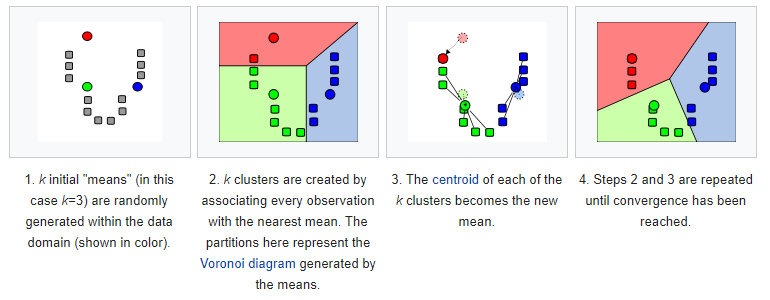

In [201]:
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/kmeans.png', width=800, height=800)

In [202]:
import time
from tqdm import tqdm

1.簇的数目k

为了找到最佳k值，我们将研究不同k值下的失真。失真计算从每个点到其指定中心的距离的平方之和。当对k绘制失真图时，将有一个k值，在该值之后失真的减少是最小的。这是所需的群集数。

In [203]:
%%time
from sklearn import metrics
from scipy.spatial.distance import cdist

# run kmeans with many different k
distortions = []
K = range(2, 40)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
    k_means.fit(X_reduced)
    #cdist: 计算两个矩阵行间的所有向量对的欧式距离(euclidean)
#     distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])
    distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X_vec_v3.shape[0])
    print('Found distortion for {} clusters'.format(k))

Found distortion for 2 clusters
Found distortion for 3 clusters
Found distortion for 4 clusters
Found distortion for 5 clusters
Found distortion for 6 clusters
Found distortion for 7 clusters
Found distortion for 8 clusters
Found distortion for 9 clusters
Found distortion for 10 clusters
Found distortion for 11 clusters
Found distortion for 12 clusters
Found distortion for 13 clusters
Found distortion for 14 clusters
Found distortion for 15 clusters
Found distortion for 16 clusters
Found distortion for 17 clusters
Found distortion for 18 clusters
Found distortion for 19 clusters
Found distortion for 20 clusters
Found distortion for 21 clusters
Found distortion for 22 clusters
Found distortion for 23 clusters
Found distortion for 24 clusters
Found distortion for 25 clusters
Found distortion for 26 clusters
Found distortion for 27 clusters
Found distortion for 28 clusters
Found distortion for 29 clusters
Found distortion for 30 clusters
Found distortion for 31 clusters
Found distortion f

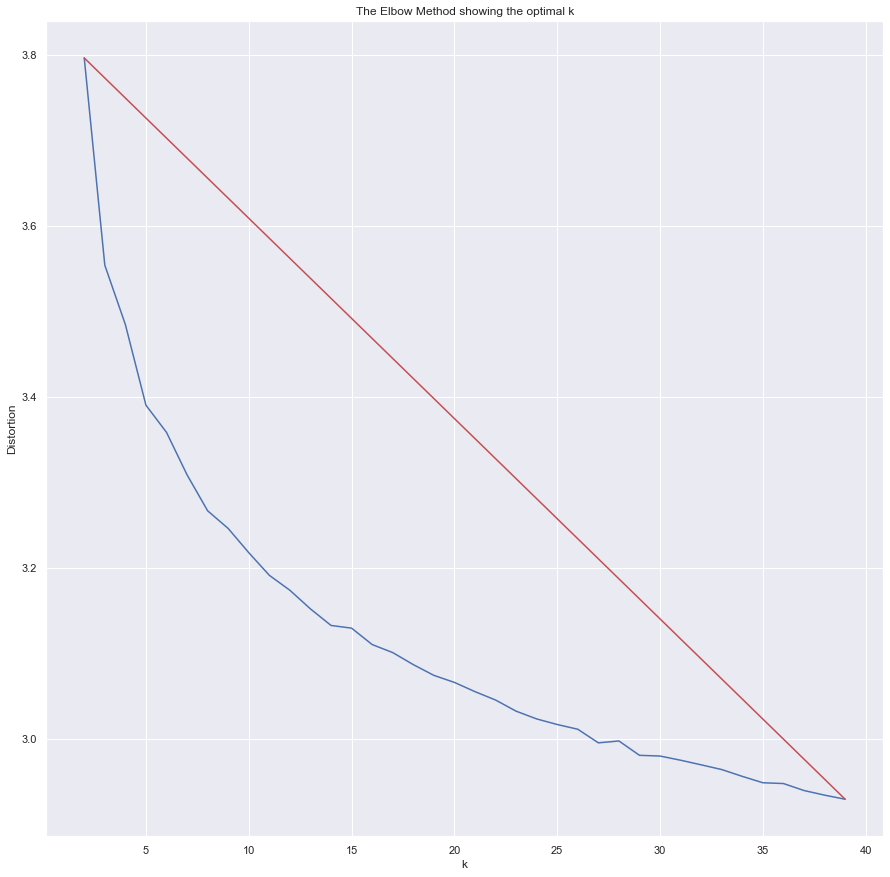

In [204]:
from matplotlib import pyplot as plt
X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

在这个图中，我们可以看到更好的k值在18-25之间。在这之后，失真的减少就不那么显著了。为了简单起见，我们将使用k=20

2.运行k-means

找到合适的k值后，我们可以在PCA处理的特征向量上运行k-means（X_reduced）。

In [205]:
%%time
k = 20
tqdm()
kmeans = KMeans(n_clusters=k, random_state=42)# 获取模型，n_clusters将预测结果分为几簇
y_pred = kmeans.fit_predict(X_reduced)#训练并直接预测分类结果
df['y'] = y_pred #将分类结果1,...,20赋值给属性y




0it [00:00, ?it/s]


CPU times: user 13.4 s, sys: 1.33 s, total: 14.8 s
Wall time: 5.79 s


# 五、t-SNE降维

利用t-SNE可以将高维特征向量降到二维。将这两个维度用作x、y坐标，可以画出body_text。t-分布随机邻域嵌入（t-SNE）在尽量保持相似实例靠近和不相似实例远离的同时，降低了维数。它主要用于可视化，特别是在高维空间中可视化实例集群。

In [206]:
from sklearn.manifold import TSNE
tsne = TSNE(verbose=1, perplexity=100, random_state=42)#verbose是否打印优化信息，取值0或1，默认为0=>不打印信息。打印的信息为：近邻点数量、耗时、σ、KL散度、误差等。perpexity混乱度，表示t-SNE优化过程中考虑邻近点的多少
# X_embedded = tsne.fit_transform(X.toarray())#数据经过tsne降维后是二维的 
X_embedded = tsne.fit_transform(X_vec_v3)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8581 samples in 0.671s...
[t-SNE] Computed neighbors for 8581 samples in 115.675s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8581
[t-SNE] Computed conditional probabilities for sample 2000 / 8581
[t-SNE] Computed conditional probabilities for sample 3000 / 8581
[t-SNE] Computed conditional probabilities for sample 4000 / 8581
[t-SNE] Computed conditional probabilities for sample 5000 / 8581
[t-SNE] Computed conditional probabilities for sample 6000 / 8581
[t-SNE] Computed conditional probabilities for sample 7000 / 8581
[t-SNE] Computed conditional probabilities for sample 8000 / 8581
[t-SNE] Computed conditional probabilities for sample 8581 / 8581
[t-SNE] Mean sigma: 1.089434
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.044922
[t-SNE] KL divergence after 1000 iterations: 2.009056


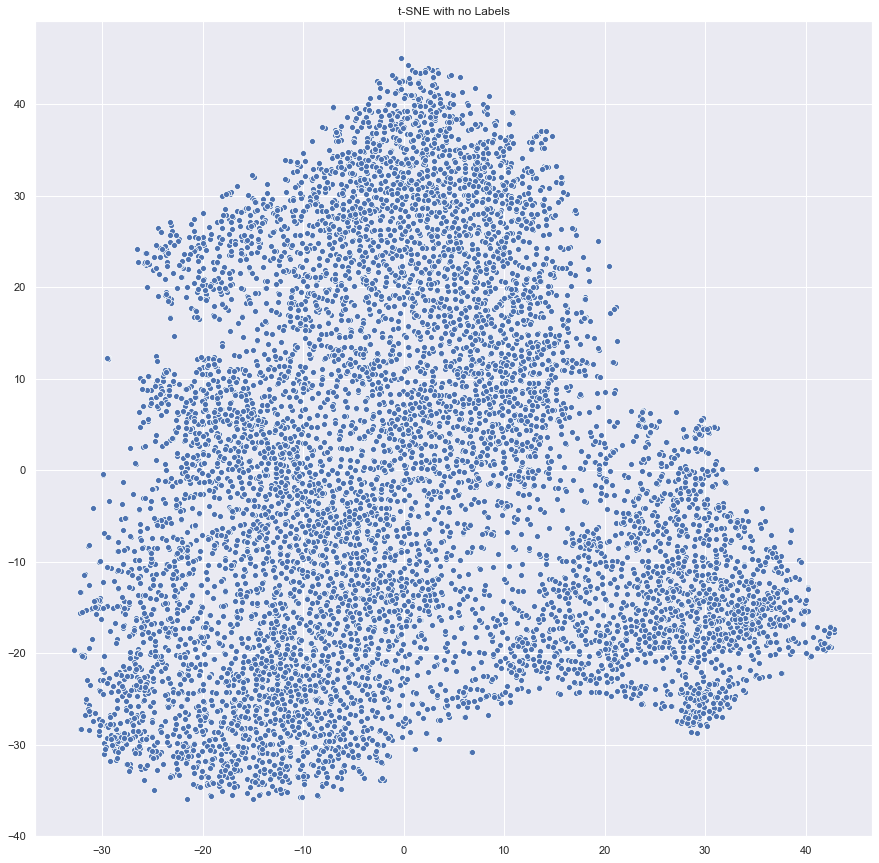

In [207]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)
plt.title('t-SNE with no Labels')
plt.savefig("t-sne_covid19.png")
plt.show()

我们可以检测到一些实例集群，但靠近中心的许多实例很难分离。t-SNE在降维方面做得很好，但是现在我们需要一些标签。让我们使用k-means找到的集群作为标签。这将有助于从视觉上分离不同的主题集中。

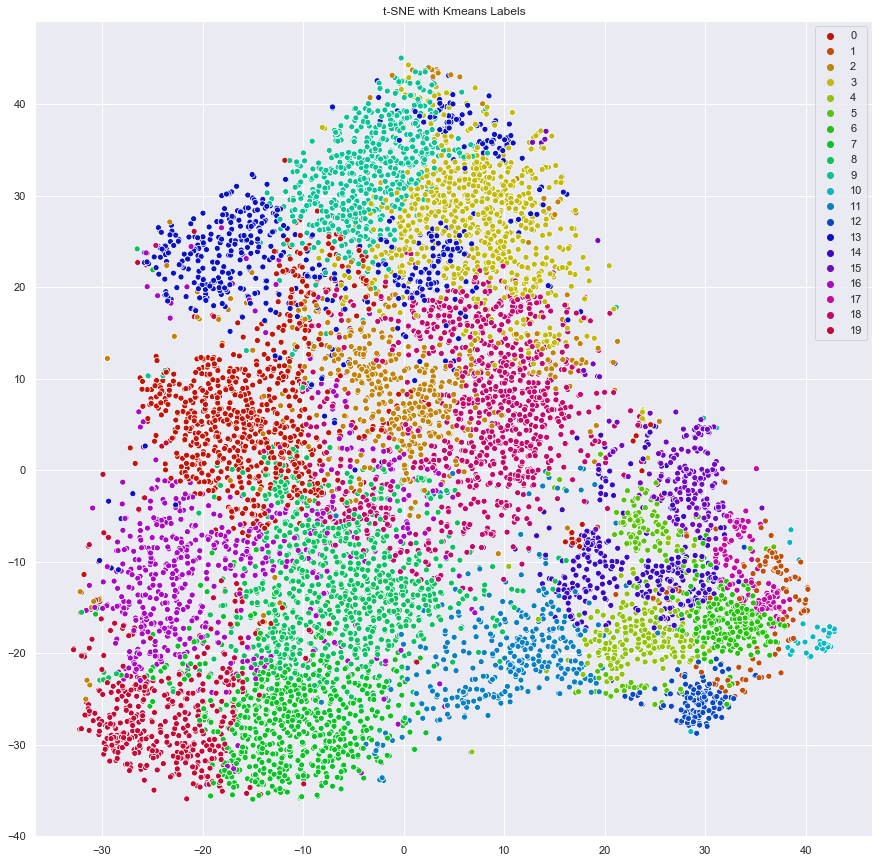

In [208]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)#在HLS色调空间中获取一组均匀间隔的颜色。n_colors调色板中的颜色数，l亮度，s饱和度

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

# 六、每个集群的主题建模

现在我们将尝试在每一组词中找出最有意义的词。K-means对文章进行了聚类，但没有标记主题。通过主题建模，我们将找出每个集群最重要的术语是什么。这将通过提供关键字来快速识别集群的主题，为集群添加更多的含义。
对于主题建模，我们将使用LDA（隐狄利克雷分配模型，是一种用于离散数据集合（如文本语料库）的生成概率模型）。在LDA中，每个文档可以通过主题的分布来描述，每个主题可以通过单词的分布来描述。

In [209]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

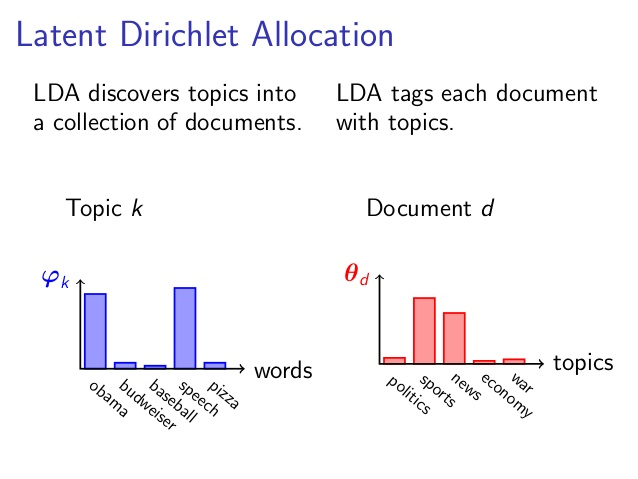

In [210]:
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/resources/lda.jpg', width=600, height=600)

首先，我们将创建20个词频向量器CountVectorizer，每个向量器对应一个集群标签。由于LDA是基于词频统计的，因此一般不用TF-IDF来做文档特征。

In [211]:
%%time
vectorizers = []
    
for ii in range(0, 20):
    # Creating a vectorizer
    #CountVectorizer会将文本中的词语转换为词频矩阵，通过fit_transform()计算各个词语出现的次数。token_pattern过滤规则，表示token的正则表达式。
    #min_df,max_df构造语料库的关键词集时的阈值，即某个词的document frequence大于max_df，这个词不会被当作关键词。
    vectorizers.append(CountVectorizer(min_df=5, max_df=0.9, stop_words='english', lowercase=True, token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}'))

CPU times: user 87.9 ms, sys: 383 ms, total: 471 ms
Wall time: 938 ms


In [212]:
vectorizers[0]

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=0.9, max_features=None, min_df=5,
                ngram_range=(1, 1), preprocessor=None, stop_words='english',
                strip_accents=None, token_pattern='[a-zA-Z\\-][a-zA-Z\\-]{2,}',
                tokenizer=None, vocabulary=None)

然后，将对每个簇中的文本的词语转换为词频矩阵CountVectorizer.fit_transform()，矩阵元素 a[i][j] 表示 j 词在 i 类文本下的词频。

In [213]:
%%time
vectorized_data = []

for current_cluster, cvec in enumerate(vectorizers):
    try:
        vectorized_data.append(cvec.fit_transform(df.loc[df['y'] == current_cluster, 'processed_text']))
    except Exception as e:
        print("Not enough instances in cluster: " + str(current_cluster))
        vectorized_data.append(None)

CPU times: user 20.6 s, sys: 5.93 s, total: 26.6 s
Wall time: 37.5 s


In [214]:
len(vectorized_data)

20

In [215]:
%%time
# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = 20

lda_models = []
for ii in range(0, 20):
    # Latent Dirichlet Allocation Model 为每个簇创建LDA模型
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)#max_iter表示最大迭代次数
    lda_models.append(lda)
    
lda_models[0]

CPU times: user 1.45 ms, sys: 28.4 ms, total: 29.9 ms
Wall time: 75.7 ms


LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=20, n_jobs=None,
                          perp_tol=0.1, random_state=42, topic_word_prior=None,
                          total_samples=1000000.0, verbose=False)

在前面的步骤中，我们为每个集群创建了一个相应的LDA模型。我们现在将把所有LDA模型拟合到它们各自的簇向量上

In [216]:
%%time
clusters_lda_data = []

for current_cluster, lda in tqdm(enumerate(lda_models)):
#     print("Current Cluster: " + str(current_cluster))
    
    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))#LDA模型训练每个簇上的语料




0it [00:00, ?it/s]


1it [00:20, 20.25s/it]


2it [00:22, 14.85s/it]


3it [00:35, 14.36s/it]


4it [00:54, 15.66s/it]


5it [00:57, 11.94s/it]


6it [01:01,  9.38s/it]


7it [01:04,  7.57s/it]


8it [01:24, 11.38s/it]


9it [01:44, 13.90s/it]


10it [02:06, 16.19s/it]


11it [02:06, 11.56s/it]


12it [02:15, 10.63s/it]


13it [02:18,  8.54s/it]


14it [02:39, 12.03s/it]


15it [02:45, 10.28s/it]


16it [02:50,  8.88s/it]


17it [03:14, 13.18s/it]


18it [03:16,  9.83s/it]


19it [03:42, 14.84s/it]


20it [03:56, 11.84s/it]

CPU times: user 13min 33s, sys: 1min 50s, total: 15min 24s
Wall time: 3min 56s


从每个簇中提取关键字

In [217]:
# Functions for printing keywords for each topic
def selected_topics(model, vectorizer, top_n=3):
    current_words = []
    keywords = []
    #通过fit_transform函数，我们就可以得到文档的主题模型分布在docres中。而主题词分布则在lda.components_中。
    for idx, topic in enumerate(model.components_):#输出每个簇的主题的权重值
        words = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]#get_feature_names()获取词袋模型中的所有词
        for word in words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.append(word[0])
                
    keywords.sort(key = lambda x: x[1]) #排序
    keywords.reverse()
    return_values = []
    for ii in keywords:
        return_values.append(ii[0])
    return return_values

将单个群集的关键字列表附加到长度为2D的列表NUM_TOPICS_PER_CLUSTER

In [219]:
%%time
all_keywords = []
for current_vectorizer, lda in tqdm(enumerate(lda_models)):
#     print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None: #当前簇的词频矩阵
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))




0it [00:00, ?it/s]


1it [00:00,  1.93it/s]


2it [00:00,  2.53it/s]


3it [00:01,  2.55it/s]


4it [00:01,  2.55it/s]


5it [00:01,  3.20it/s]


6it [00:01,  3.80it/s]


7it [00:01,  4.46it/s]


8it [00:02,  3.75it/s]


9it [00:02,  3.52it/s]


10it [00:02,  2.89it/s]


12it [00:03,  3.59it/s]


13it [00:03,  4.30it/s]


14it [00:03,  3.34it/s]


15it [00:03,  3.81it/s]


16it [00:04,  4.35it/s]


17it [00:04,  3.41it/s]


19it [00:05,  3.53it/s]


20it [00:05,  3.70it/s]

CPU times: user 5.31 s, sys: 72.4 ms, total: 5.38 s
Wall time: 5.4 s


In [220]:
all_keywords[0][:10] #all_keywords[i][:j]表示在第i簇的前j个关键词

['cell',
 'respiratory',
 'use',
 'study',
 'treatment',
 'group',
 'drug',
 'infection',
 'cat',
 'child']

In [221]:
len(all_keywords)

20

将当前输出保存到文件。确保生成bokeh图的重要输出被保存以备将来使用。

In [222]:
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

In [223]:
import pickle

# save the COVID-19 DataFrame, too large for github
pickle.dump(df, open("df_covid.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded.p", "wb" ))

# save the labels generate with k-means(20)
pickle.dump(y_pred, open("y_pred.p", "wb" ))

# 七、分类

运行k-means之后，尽管数据现在是被任意“标记”的。我们现在使用有监督的学习来查看聚类的泛化程度，这只是评估聚类的一种方法。如果k-means能够在数据中找到有意义的分割，那么应该可以训练分类器来预测给定实例应该属于哪个集群。

In [224]:
%%time
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='macro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='macro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='macro')) * 100), "%")

CPU times: user 39 µs, sys: 433 µs, total: 472 µs
Wall time: 573 µs


In [225]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
# X_train, X_test, y_train, y_test = train_test_split(X.toarray(),y_pred, test_size=0.2, random_state=42)#y_pred是k-means的簇
X_train, X_test, y_train, y_test = train_test_split(X_vec_v3, y_pred, test_size=0.2, random_state=42)#y_pred是k-means的簇

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 6864
X_test size: 1717 



In [226]:
%%time
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import SGDClassifier

# SGD instance
sgd_clf = SGDClassifier(max_iter=10000, tol=1e-3, random_state=42, n_jobs=4)#随机梯度下降分类器
# train SGD
sgd_clf.fit(X_train, y_train)

# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_train, y_train, cv=3, n_jobs=4)#交叉验证获得预测，返回的是estimator的分类结果(或回归值)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Training Set)", y_train, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  73.033 %
     Precision:  76.602 %
        Recall:  74.311 %
      F1 score:  74.548 %
CPU times: user 7.15 s, sys: 1.41 s, total: 8.56 s
Wall time: 6.47 s


测试过拟合，看模型是如何在测试集上进行泛化的。

In [227]:
# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_test, y_test, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Testing Set)", y_test, sgd_pred)

Stochastic Gradient Descent Report (Testing Set) :

Accuracy Score:  66.744 %
     Precision:  72.932 %
        Recall:  61.841 %
      F1 score:  64.874 %


模型如何在整个数据集上进行泛化。

In [229]:
%%time
sgd_cv_score = cross_val_score(sgd_clf, X_vec_v3, y_pred, cv=10)#cv选择每次测试折数，X是对body_text进行tf-idf向量化后的词频矩阵，大小为(8581, 4096)
print("Mean cv Score - SGD: {:,.3f}".format(float(sgd_cv_score.mean()) * 100), "%")#10折交叉验证计算模型的得分

Mean cv Score - SGD: 75.714 %
CPU times: user 1min 34s, sys: 1.22 s, total: 1min 36s
Wall time: 27.1 s


# 八、绘制数据散点图

前面的步骤为我们提供了分类标签和一个缩小到二维的论文数据集。通过与Bokeh配对，我们可以创建一个互动的论文散点图。组织下论文，使相关的发表论文靠近。为了理解这些相似之处，我们还对每一组论文进行了主题建模，以便找出关键术语。Bokeh将把实际的文件与他们在t-SNE图上的位置配对。通过这种方法，可以更容易地看到论文是如何结合在一起的，这样既可以对数据集进行探索，也可以对聚类进行评估。

In [122]:
import os

# change into lib directory to load plot python scripts
main_path = os.getcwd() #返回当前工作目录
print(main_path)
lib_path = '/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources'
os.chdir(lib_path)

/Users/yangshoujian/PycharmProjects/Machine Learning


In [124]:
!git clone https://github.com/MaksimEkin/COVID19-Literature-Clustering/

Cloning into 'COVID19-Literature-Clustering'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 651 (delta 23), reused 4 (delta 1), pack-reused 605
Receiving objects: 100% (651/651), 223.06 MiB | 2.52 MiB/s, done.
Resolving deltas: 100% (322/322), done.
Checking out files: 100% (42/42), done.
[Errno 2] No such file or directory: '/content/COVID19-Literature-Clustering/lib/'
/Users/yangshoujian/PycharmProjects/Machine Learning


ModuleNotFoundError: No module named 'callbacks'

In [127]:
pip install bokeh

    100% |████████████████████████████████| 8.6MB 1.6MB/s ta 0:00:011
  Stored in directory: /Users/yangshoujian/Library/Caches/pip/wheels/a3/5e/7d/49405a043a4714a1b66bb7a16dfe16a1f0db9217baac7c4fe3
Successfully built bokeh
Note: you may need to restart the kernel to use updated packages.


In [128]:
%cd /Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/lib/
from call_backs import input_callback, selected_code
%cd

/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/lib
/Users/yangshoujian


In [129]:
# required libraries for plot
from call_backs import input_callback, selected_code  # file with customJS callbacks for bokeh
                                                      # github.com/MaksimEkin/COVID19-Literature-Clustering/blob/master/lib/call_backs.py
import bokeh #Bokeh(Bokeh.js)是一个Python交互式可视化库，支持现代化Web浏览器，提供非常完美的展示功能。Bokeh可以用于交互式发现数据。
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, widgetbox, row, layout
from bokeh.layouts import column

In [130]:
# go back
os.chdir(main_path)

1.为每个集群加载关键字

In [131]:
import os

topic_path = 'topics.txt'
with open(topic_path) as f:
    topics = f.readlines()

2.Setup

In [132]:
%%time
# show on notebook
output_notebook()
# target labels
y_labels = y_pred #y_pred是预测出来的k-means的簇

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    titles= df['title'],
    authors = df['authors'],
    journal = df['journal'],
    abstract = df['abstract_summary'],
    labels = ["C-" + str(x) for x in y_labels],#20个簇
    links = df['doi']
    ))

# hover over information
hover = HoverTool(tooltips=[#HoverTool当用户将鼠标悬停在数据点上时出现的提示工具(tooltips)
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors{safe}"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
    ("Link", "@links")
],
point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
plot = figure(plot_width=1200, plot_height=850, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'], 
           title="Clustering of the COVID-19 Literature with t-SNE and K-Means", 
           toolbar_location="above")

# plot settings
plot.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')
plot.legend.background_fill_alpha = 0.6

Loading BokehJS ...

CPU times: user 95.6 ms, sys: 123 ms, total: 219 ms
Wall time: 336 ms


3.Widgets

In [169]:
%%time
from bokeh.models import CustomJS, ColumnDataSource, Slider
# Keywords
text_banner = Paragraph(text= 'Keywords: Slide to specific cluster to see the keywords.', height=45)
input_callback_1 = input_callback(plot, source, text_banner, topics)

# currently selected article
div_curr = Div(text="""Click on a plot to see the link to the article.""",height=150)
callback_selected = CustomJS(args=dict(source=source, current_selection=div_curr), code=selected_code())
taptool = plot.select(type=TapTool)
taptool.callback = callback_selected

# WIDGETS
#slider = Slider(start=0, end=20, value=20, step=1, title="Cluster #", callback=input_callback_1)
slider = Slider(start=0, end=20, value=20, step=1, title="Cluster #")#滑块
#keyword = TextInput(title="Search:", callback=input_callback_1)
keyword = TextInput(title="Search:")

# pass call back arguments
input_callback_1.args["text"] = keyword
input_callback_1.args["slider"] = slider

CPU times: user 4.13 ms, sys: 285 µs, total: 4.41 ms
Wall time: 4.22 ms


4.Style风格

In [170]:
# STYLE
slider.sizing_mode = "stretch_width"
slider.margin=15

keyword.sizing_mode = "scale_both"
keyword.margin=15

div_curr.style={'color': '#BF0A30', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
div_curr.sizing_mode = "scale_both"
div_curr.margin = 20

text_banner.style={'color': '#0269A4', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
text_banner.sizing_mode = "scale_both"
text_banner.margin = 20

plot.sizing_mode = "scale_both"
plot.margin = 5

r = row(div_curr,text_banner)
r.sizing_mode = "stretch_width"

5.SHOW展示

In [171]:
# LAYOUT OF THE PAGE
l = layout([
    [slider, keyword],
    [text_banner],
    [div_curr],
    [plot],
])
l.sizing_mode = "scale_both"

# show
output_file('t-sne_covid-19_interactive.html')
show(l)

# 九、运用散点图

图上的每个点代表一篇研究文章。它们是由k-means找到的集群编号进行颜色编码的。默认情况下，不选择任何集群，并显示所有集群。要选择不同的集群，请将滑块设置为所需的集群编号。当选择单个集群时，在该集群中找到的关键字列表将显示在散点图上方。你也可以按特定关键字在单个集群中或在所有集群中搜索文章。让我们看一个如何使用这个工具的例子。

首先让我们看看不同的集群，查看每个集群的关键字（我们通过主题建模确定的关键字）。以cluster#9的关键字为例。这个集群似乎以牲畜为中心

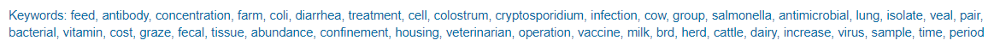

In [159]:
Image(filename="/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/demo/cluster_9_keywords.PNG", width=1170, height=60)

下面是实际的集群，放大后的图：

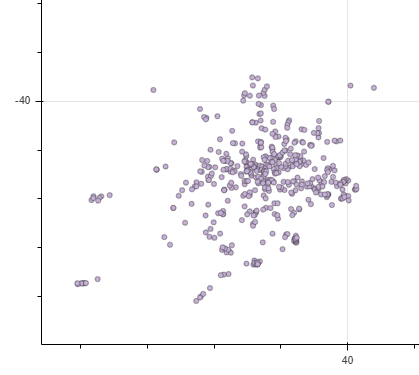

In [160]:
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/demo/cluster_9.PNG', width=420, height=375)

假设我们对牛特别感兴趣。让我们用关键词搜索来过滤那些特别提到牛的论文。这就是同一个集群现在的样子：

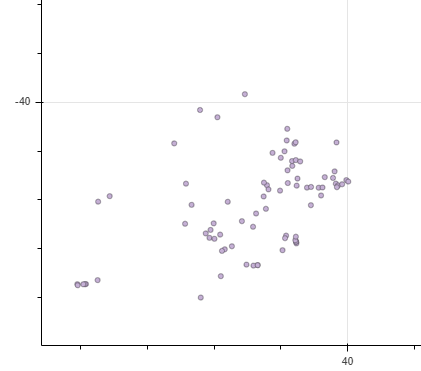

In [161]:
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/demo/cluster_9_cattle.PNG', width=420, height=375)

显示的文章现在有点薄了，只显示了属于集群的一部分并且包含关键字“牛”的文章。通过将集群的#设置为默认值20，搜索也可以扩展到整个数据集。将鼠标悬停在任何文章上都会提供基本信息，如标题、作者和摘要。点击一篇文章将把文章固定在图的上方，并给出一个网址，引导用户阅读整篇文章。点击一篇文章的效果如下：

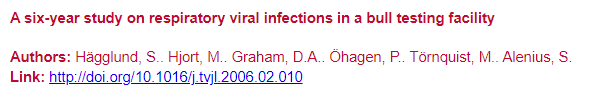

In [162]:
Image(filename='/Users/yangshoujian/iCloud云盘（归档）/研一/研一下/机器学习/data/kaggle-resources/COVID19-Literature-Clustering/demo/selected_paper.PNG', width=600, height=100)

1.举例

这个散点图可以用来快速找到许多关于类似主题的出版物。例如，假设我们有兴趣找到关于面具及其功效的信息。为此，我们可以尝试找到一个带有关键字（如“mask”）的集群，也可以直接搜索该词，并尝试确定它与哪个集群最密切相关。

如果搜索“mask”，将展示深绿色簇（#12）。对标题的快速浏览表明，这些出版物主要针对不同的口罩及其对医护人员的用途。

搜索一个关键术语可能会导致你无意中过滤掉使用不同短语的高度相似的论文。在初步检查之后，清除搜索项并通过调整滑块浏览整个集群。在本例中，我们将滑块设置为12，并在整个群集中查找论文。

现在我们将探讨几个面向任务的问题。

2.我们对诊断和监视了解多少？

（1）Diagnostics

首先，我们首先搜索了这个问题中的一个关键词（“diagnostics”）

对于“diagnostics”，棕色簇（#17）立即突出

接下来，我们移除搜索项并将滑块调整为17

在17号簇里面，有一个主簇和一个较小的、更密集的子簇，就在主簇的右侧。这个主簇和子簇似乎都包含了诊断病毒感染的有用信息。我们很快浏览了一下出版物，看到了如下论文：

（2）Surveillance

接下来，我们通过将滑块调整到簇20（簇范围从0到19；20全部绘图）返回到完整绘图

然后我们用关键词“surveillance”重复搜索过程

这个搜索词的主簇是cluster#8。在清除搜索框并将滑块调整为8之后，我们查看了这个簇中的一些标题和摘要

看到了如下论文：

3.我们对疫苗和治疗学了解多少？

（1）Vaccine

为了确定首先要检查哪一簇关于疫苗的论文，我们使用了与以前不同的策略

通过对每个聚类的主题建模生成的关键词进行检查，我们发现15个聚类有相关的关键词，如“疫苗”、“血清”和“分娩”

为了进一步验证，我们还搜索了整个数据集中的“vaccine”，发现簇15的代表性很好

在探索这个簇的时候，我们遇到了一个代表性过高的问题——许多出版论文关注的是似乎无关联的疫苗。为了解决这个问题，我们在簇中寻找“corona（冠状）”

这缩小了出版论文的范围，使人们更容易找到有趣的论文。以下是我们发现的一些：

（2）Therapeutics

簇1有更多关于疫苗/疗法的信息

具体来说，有很多关于冠状病毒的信息（簇中最重要的关键字是MERS）

簇1的一些有趣的论文：

# 十、结论

在项目中，我们尝试对关于COVID-19的已发表的文献进行聚集，并降低数据集的维度，以达到可视化的目的。这就允许了与COVID-19相关的论文的交互式散点图，其中相似主题的材料被组合在一起。通过这种方式对文献进行分组，专业人员可以快速找到与中心主题相关的材料。不必手动搜索相关的工作，每个出版文献都连接到一个更大的主题聚类。通过k-means对文献正文的预处理、向量化进行数据的聚类。由于k-means将数据简单地划分为多个簇，因此通过LDA进行主题建模来识别关键词。这给出了在每个集群中普遍存在的主题。聚类和关键字都是通过无监督的学习模型发现的，它们可以帮助揭示人类可能根本没有想过的模式。在这个项目的任何一部分中，我们都不需要手工组织论文：结果是由于数据中潜在的联系。

K-means（用颜色表示）和t-SNE（用点表示）能够独立地找到聚类，表明论文之间的关系是可以识别和测量的。具有高度相似主题的论文通常在点上彼此接近，并带有相同的k-mean标签。然而，由于数据集的复杂性，k-means和t-SNE有时会得到不同的决策。许多给定文献的主题是延伸的，没有具体的决策边界。这意味着k-means和t-SNE可以找到不同的相似点来对论文进行分组。在这种情况下，我们的方法表现得相当好。

由于这是一个无监督的学习问题，我们的评价并不精确科学。首先，对点进行分析，可以肯定集群实际上正在形成。在确信这一点之后，我们检查了不同簇的一些论文的标题/摘要。在大多数情况下，类似的研究领域是聚集的。我们最后的评估方法是分类。通过训练一个带有k-means标签的分类模型，然后在单独的数据子集上对其进行测试，我们可以看到因为分类器表现良好，聚类并不是完全任意的。

我们对这些文献的手工检查是相当有限的，没有哪位作者有资格评估这些文献的意义。尽管如此，很明显，关于关键主题的文章可以很容易地在彼此靠近的个体间找到。例如，搜索“口罩”可以显示评估口罩功效的一个子类论文。我们相信，卫生专业人员可以利用这个工具在文本中找到真正的链接。通过整理文献，有资格的人可以很快找到相关的来回答任务问题的出版文献。正如这个notebook所描述的抽取和构成基础的数据分析技术，开发一个用户界面/工具，以用户友好的方式呈现相关文章，可以进一步改进该项目。